===========================

Next, using scCustomize, I will continue with qc metrics\
visualizations as violin plots etc.\
Especially, I will look at distribution of those metrics and\
and if necessary, I will filter out the outlier and low quality cells.\

I will use some command and analysis approaches from the PART_4A notebook\
such as scater::plotExplanatoryVariables, and scran::modelGeneVar. 

In [1]:
getwd()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/GENE_EXPRESSION/MOUSE/STROKE/2022_Zheng_K_et_al/28_10_24"

In [2]:
here::here()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/Datasets/GENE_EXPRESSION/MOUSE/STROKE/2022_Zheng_K_et_al/28_10_24"

In [3]:
my_seurat_extend_scCustomize_lib  <- 
    "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/renv_envs/seuratExtend_scCustomize/renv/library/linux-rhel-9.4/R-4.4/x86_64-unknown-linux-gnu"

In [4]:
.libPaths()

[1] "/fast/home/y/ykazci/R/x86_64-unknown-linux-gnu-library/4.3"               
[2] "/gnu/store/asn7yfxccx9hqi4afrnw685xw6c6382z-profile/site-library"         
[3] "/gnu/store/29x2k7i71g9xq09xmbj1lk515cl7if63-r-minimal-4.4.2/lib/R/library"

In [5]:
.libPaths(new = my_seurat_extend_scCustomize_lib, include.site = FALSE)

In [6]:
.libPaths()

[1] "/fast/AG_Bunina/Yusuf/Project_Endothelial_and_Stroke/renv_envs/seuratExtend_scCustomize/renv/library/linux-rhel-9.4/R-4.4/x86_64-unknown-linux-gnu"
[2] "/gnu/store/29x2k7i71g9xq09xmbj1lk515cl7if63-r-minimal-4.4.2/lib/R/library"

In [7]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp

'SeuratObject' was built under R 4.4.1 but the current version is
4.4.2; it is recomended that you reinstall 'SeuratObject' as the ABI
for R may have changed

'SeuratObject' was built with package 'Matrix' 1.7.0 but the current
version is 1.7.1; it is recomended that you reinstall 'SeuratObject' as
the ABI for 'Matrix' may have changed


Attaching package: 'SeuratObject'


The following objects are masked from 'package:base':

    intersect, t




In [8]:
# my custom plotting configurations:

my_theme <- ggplot2::theme(
    axis.title.x = ggplot2::element_text(size = 14),  # X-axis title size
    axis.title.y = ggplot2::element_text(size = 14),  # Y-axis title size
    axis.text.x  = ggplot2::element_text(size = 14, angle = 45, hjust = 1),  # X-axis tick labels
    axis.text.y  = ggplot2::element_text(size = 14),  # Y-axis tick labels
    legend.text  = ggplot2::element_text(size = 15)   # Legend text size
)

my_margin <- ggplot2::theme(plot.margin = ggplot2::unit(c(1, 1, 1, 1), "cm")) 

my_colours = c(
    "#5A5156FF", "#F6222EFF", "#FE00FAFF", "#16FF32FF",
    "#3283FEFF", "#FEAF16FF", "#B00068FF", "#1CFFCEFF", "#90AD1CFF",
    "#2ED9FFFF", "#DEA0FDFF", "#AA0DFEFF", "#F8A19FFF", "#325A9BFF",
    "#C4451CFF", "#1C8356FF", "#85660DFF", "#B10DA1FF", "#FBE426FF",
    "#1CBE4FFF", "#FA0087FF", "#FC1CBFFF", "#F7E1A0FF", "#C075A6FF",
    "#782AB6FF", "#AAF400FF", "#BDCDFFFF", "#822E1CFF", "#B5EFB5FF",
    "#7ED7D1FF", "#1C7F93FF", "#D85FF7FF", "#683B79FF", "#66B0FFFF",
    "#3B00FBFF"
)

In [9]:
zheng_et_al_seurat <- 
    readRDS(here::here('r_objects', 'zheng_et_al_seurat_w_qc_metrics.RDS'))

In [10]:
zheng_et_al_seurat

An object of class Seurat 
19707 features across 58528 samples within 1 assay 
Active assay: RNA (19707 features, 0 variable features)
 1 layer present: counts
 4 dimensional reductions calculated: Xpca_, XscVI_, XscVImde_, Xumap_

In [12]:
# custom function to pull slots:

pull_slot <- function(.data, slot_name) {
  slot(.data, rlang::as_string(rlang::ensym(slot_name)))
}

In [13]:
library(magrittr)

In [14]:
zheng_et_al_seurat %>% pull_slot(meta.data) %>% head()

,orig.ident,nCount_RNA,nFeature_RNA,_index,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,...,log10GenesPerUMI,percent_top50,percent_oxphos,percent_apop,percent_dna_repair,percent_ieg,percent_hemo,S.Score,G2M.Score,Phase
,<fct>,<dbl>,<int>,<chr>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AAACCTGAGCGAAGGG-1-GSM5319988_sham2_,SeuratProject,1438,933,AAACCTGAGCGAAGGG-1-GSM5319988_sham2_,GSM5319988_sham2_,933,6.839476,1438,7.271704,25.03477,...,0.9405030,25.03477,3.477051,1.808067,0.9735744,2.016690,0.00000000,0.0111308855,0.056332806,G2M
AAACCTGAGCTAACAA-1-GSM5319988_sham2_,SeuratProject,1603,983,AAACCTGAGCTAACAA-1-GSM5319988_sham2_,GSM5319988_sham2_,983,6.891626,1603,7.380256,27.57330,...,0.9337334,27.57330,4.117280,2.620087,0.8733624,3.680599,0.00000000,-0.0003486534,0.007043034,G2M
AAACCTGAGGCTAGCA-1-GSM5319988_sham2_,SeuratProject,2384,1298,AAACCTGAGGCTAGCA-1-GSM5319988_sham2_,GSM5319988_sham2_,1298,7.169350,2384,7.776955,27.68456,...,0.9218218,27.68456,3.859060,2.348993,1.3842282,4.026846,0.04194631,0.0334572949,0.025889747,S
AAACCTGAGGTGCACA-1-GSM5319988_sham2_,SeuratProject,2906,1309,AAACCTGAGGTGCACA-1-GSM5319988_sham2_,GSM5319988_sham2_,1309,7.177782,2906,7.974877,30.17894,...,0.8999924,30.17894,1.961459,2.821748,1.0667584,2.202340,0.03441156,0.0291239086,0.066760205,G2M
AAACCTGAGTTTAGGA-1-GSM5319988_sham2_,SeuratProject,2928,1164,AAACCTGAGTTTAGGA-1-GSM5319988_sham2_,GSM5319988_sham2_,1164,7.060476,2928,7.982416,36.74863,...,0.8844339,36.74863,2.459016,1.741803,0.9562842,1.639344,0.00000000,0.0346371846,0.098559232,G2M
AAACCTGCAACACGCC-1-GSM5319988_sham2_,SeuratProject,2153,1175,AAACCTGCAACACGCC-1-GSM5319988_sham2_,GSM5319988_sham2_,1175,7.069874,2153,7.675082,29.95820,...,0.9210913,29.95820,3.483511,2.461681,1.0218300,1.904320,0.00000000,0.0250575633,0.026391835,G2M


In [15]:
zheng_et_al_seurat %>% pull_slot(meta.data) %>% colnames() %>% print()

 [1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "_index"                     
 [5] "sample"                      "n_genes_by_counts"          
 [7] "log1p_n_genes_by_counts"     "total_counts"               
 [9] "log1p_total_counts"          "pct_counts_in_top_50_genes" 
[11] "pct_counts_in_top_100_genes" "pct_counts_in_top_200_genes"
[13] "pct_counts_in_top_500_genes" "n_genes"                    
[15] "doublet_score"               "predicted_doublet"          
[17] "status"                      "leiden"                     
[19] "_scvi_batch"                 "_scvi_labels"               
[21] "percent_mito"                "percent_ribo"               
[23] "percent_mito_ribo"           "log10GenesPerUMI"           
[25] "percent_top50"               "percent_oxphos"             
[27] "percent_apop"                "percent_dna_repair"         
[29] "percent_ieg"                 "percent_hemo"               
[31] "S.Score"           

In [16]:
zheng_et_al_seurat %>% use_series(sample) %>% table()

.
GSM5319987_sham1_ GSM5319988_sham2_ GSM5319989_sham3_ GSM5319990_MCAO1_ 
             8771              8540              9980             11772 
GSM5319991_MCAO2_ GSM5319992_MCAO3_ 
            11361              8104 

In [17]:
zheng_et_al_seurat %>% use_series(sample) %>% head()

AAACCTGAGCGAAGGG-1-GSM5319988_sham2_ AAACCTGAGCTAACAA-1-GSM5319988_sham2_ 
                 "GSM5319988_sham2_"                  "GSM5319988_sham2_" 
AAACCTGAGGCTAGCA-1-GSM5319988_sham2_ AAACCTGAGGTGCACA-1-GSM5319988_sham2_ 
                 "GSM5319988_sham2_"                  "GSM5319988_sham2_" 
AAACCTGAGTTTAGGA-1-GSM5319988_sham2_ AAACCTGCAACACGCC-1-GSM5319988_sham2_ 
                 "GSM5319988_sham2_"                  "GSM5319988_sham2_"

In [18]:
zheng_et_al_seurat %>% extract2('sample') %>% head()

,sample
,<chr>
AAACCTGAGCGAAGGG-1-GSM5319988_sham2_,GSM5319988_sham2_
AAACCTGAGCTAACAA-1-GSM5319988_sham2_,GSM5319988_sham2_
AAACCTGAGGCTAGCA-1-GSM5319988_sham2_,GSM5319988_sham2_
AAACCTGAGGTGCACA-1-GSM5319988_sham2_,GSM5319988_sham2_
AAACCTGAGTTTAGGA-1-GSM5319988_sham2_,GSM5319988_sham2_
AAACCTGCAACACGCC-1-GSM5319988_sham2_,GSM5319988_sham2_


In [21]:
# the leiden clusters were generated before scvi integration.
# I will remove them.

# zheng_et_al_seurat$leiden <- NULL

In [22]:
zheng_et_al_seurat %>% pull_slot(meta.data) %>% colnames() %>% print()

 [1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "_index"                     
 [5] "sample"                      "n_genes_by_counts"          
 [7] "log1p_n_genes_by_counts"     "total_counts"               
 [9] "log1p_total_counts"          "pct_counts_in_top_50_genes" 
[11] "pct_counts_in_top_100_genes" "pct_counts_in_top_200_genes"
[13] "pct_counts_in_top_500_genes" "n_genes"                    
[15] "doublet_score"               "predicted_doublet"          
[17] "status"                      "_scvi_batch"                
[19] "_scvi_labels"                "percent_mito"               
[21] "percent_ribo"                "percent_mito_ribo"          
[23] "log10GenesPerUMI"            "percent_top50"              
[25] "percent_oxphos"              "percent_apop"               
[27] "percent_dna_repair"          "percent_ieg"                
[29] "percent_hemo"                "S.Score"                    
[31] "G2M.Score"         

In [23]:
zheng_et_al_sce <- as.SingleCellExperiment(x = zheng_et_al_seurat)

Warning message:
"Layer 'data' is empty"
Warning message:
"Layer 'scale.data' is empty"


In [24]:
zheng_et_al_sce

class: SingleCellExperiment 
dim: 19707 58528 
metadata(0):
assays(1): counts
rownames(19707): Xkr4 Gm1992 ... DHRSX CAAA01147332.1
rowData names(0):
colnames(58528): AAACCTGAGCGAAGGG-1-GSM5319988_sham2_
  AAACCTGAGCTAACAA-1-GSM5319988_sham2_ ...
  TTTGTCAGTTACCGAT-1-GSM5319991_MCAO2_
  TTTGTCATCTGCGTAA-1-GSM5319991_MCAO2_
colData names(33): orig.ident nCount_RNA ... Phase ident
reducedDimNames(4): XPCA_ XSCVI_ XSCVIMDE_ XUMAP_
mainExpName: RNA
altExpNames(0):

In [25]:
options(repr.plot.width = 15, repr.plot.height = 15) 

In [26]:
p1 <- scater::plotHighestExprs(object = zheng_et_al_sce, exprs_values = 'counts')

In [27]:
# ggplot2::ggsave(filename = 'plotHighestExprs.png', plot = p1, path = here::here('r_objects'), width = 15, height = 15)

paste the output to markdown:

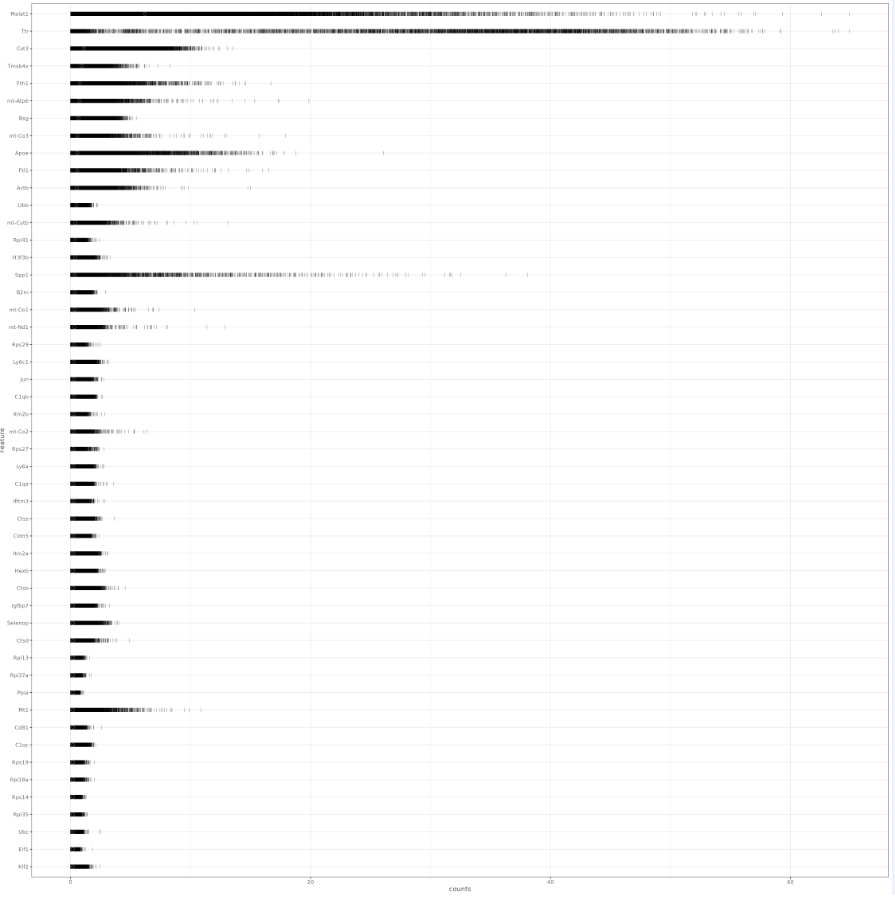

In [28]:
zheng_et_al_sce %>% slotNames()

[1] "int_elementMetadata" "int_colData"         "int_metadata"       
[4] "rowRanges"           "colData"             "assays"             
[7] "NAMES"               "elementMetadata"     "metadata"

In [29]:
zheng_et_al_sce %>% use_series(sample) %>% table()

.
GSM5319987_sham1_ GSM5319988_sham2_ GSM5319989_sham3_ GSM5319990_MCAO1_ 
             8771              8540              9980             11772 
GSM5319991_MCAO2_ GSM5319992_MCAO3_ 
            11361              8104 

In [30]:
zheng_et_al_sce %>% pull_slot(colData)

DataFrame with 58528 rows and 33 columns
                                        orig.ident nCount_RNA nFeature_RNA
                                          <factor>  <numeric>    <integer>
AAACCTGAGCGAAGGG-1-GSM5319988_sham2_ SeuratProject       1438          933
AAACCTGAGCTAACAA-1-GSM5319988_sham2_ SeuratProject       1603          983
AAACCTGAGGCTAGCA-1-GSM5319988_sham2_ SeuratProject       2384         1298
AAACCTGAGGTGCACA-1-GSM5319988_sham2_ SeuratProject       2906         1309
AAACCTGAGTTTAGGA-1-GSM5319988_sham2_ SeuratProject       2928         1164
...                                            ...        ...          ...
TTTGTCAGTCTCATCC-1-GSM5319991_MCAO2_ SeuratProject       4165         1608
TTTGTCAGTGCGCTTG-1-GSM5319991_MCAO2_ SeuratProject       1602          957
TTTGTCAGTGTGCCTG-1-GSM5319991_MCAO2_ SeuratProject       1911         1053
TTTGTCAGTTACCGAT-1-GSM5319991_MCAO2_ SeuratProject      23372         5947
TTTGTCATCTGCGTAA-1-GSM5319991_MCAO2_ SeuratProject       23

In [31]:
zheng_et_al_sce

class: SingleCellExperiment 
dim: 19707 58528 
metadata(0):
assays(1): counts
rownames(19707): Xkr4 Gm1992 ... DHRSX CAAA01147332.1
rowData names(0):
colnames(58528): AAACCTGAGCGAAGGG-1-GSM5319988_sham2_
  AAACCTGAGCTAACAA-1-GSM5319988_sham2_ ...
  TTTGTCAGTTACCGAT-1-GSM5319991_MCAO2_
  TTTGTCATCTGCGTAA-1-GSM5319991_MCAO2_
colData names(33): orig.ident nCount_RNA ... Phase ident
reducedDimNames(4): XPCA_ XSCVI_ XSCVIMDE_ XUMAP_
mainExpName: RNA
altExpNames(0):

In [32]:
zheng_et_al_sce %>% pull_slot(colData) %>% colnames()

[1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "X_index"                    
 [5] "sample"                      "n_genes_by_counts"          
 [7] "log1p_n_genes_by_counts"     "total_counts"               
 [9] "log1p_total_counts"          "pct_counts_in_top_50_genes" 
[11] "pct_counts_in_top_100_genes" "pct_counts_in_top_200_genes"
[13] "pct_counts_in_top_500_genes" "n_genes"                    
[15] "doublet_score"               "predicted_doublet"          
[17] "status"                      "X_scvi_batch"               
[19] "X_scvi_labels"               "percent_mito"               
[21] "percent_ribo"                "percent_mito_ribo"          
[23] "log10GenesPerUMI"            "percent_top50"              
[25] "percent_oxphos"              "percent_apop"               
[27] "percent_dna_repair"          "percent_ieg"                
[29] "percent_hemo"                "S.Score"                    
[31] "G2M.Score"                   "Phase"                      
[33] "ident"

In [33]:
zheng_et_al_sce <- scater::logNormCounts(zheng_et_al_sce)

In [36]:
# I will select meta.data variables and calculate their impacts
# in explaining the variation in expression of genes.

In [37]:
variables_selected <- zheng_et_al_sce %>% pull_slot(colData) %>% colnames()

In [38]:
variables_selected %>% print()

 [1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "X_index"                    
 [5] "sample"                      "n_genes_by_counts"          
 [7] "log1p_n_genes_by_counts"     "total_counts"               
 [9] "log1p_total_counts"          "pct_counts_in_top_50_genes" 
[11] "pct_counts_in_top_100_genes" "pct_counts_in_top_200_genes"
[13] "pct_counts_in_top_500_genes" "n_genes"                    
[15] "doublet_score"               "predicted_doublet"          
[17] "status"                      "X_scvi_batch"               
[19] "X_scvi_labels"               "percent_mito"               
[21] "percent_ribo"                "percent_mito_ribo"          
[23] "log10GenesPerUMI"            "percent_top50"              
[25] "percent_oxphos"              "percent_apop"               
[27] "percent_dna_repair"          "percent_ieg"                
[29] "percent_hemo"                "S.Score"                    
[31] "G2M.Score"         

In [39]:
ls()

[1] "my_colours"                       "my_margin"                       
[3] "my_seurat_extend_scCustomize_lib" "my_theme"                        
[5] "p1"                               "pull_slot"                       
[7] "variables_selected"               "zheng_et_al_sce"                 
[9] "zheng_et_al_seurat"

IMPORTANT:

Remove index column !!!!

In [40]:
variables_selected <- setdiff(variables_selected, 'X_index')

In [41]:
variables_selected %>% print()

 [1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "sample"                     
 [5] "n_genes_by_counts"           "log1p_n_genes_by_counts"    
 [7] "total_counts"                "log1p_total_counts"         
 [9] "pct_counts_in_top_50_genes"  "pct_counts_in_top_100_genes"
[11] "pct_counts_in_top_200_genes" "pct_counts_in_top_500_genes"
[13] "n_genes"                     "doublet_score"              
[15] "predicted_doublet"           "status"                     
[17] "X_scvi_batch"                "X_scvi_labels"              
[19] "percent_mito"                "percent_ribo"               
[21] "percent_mito_ribo"           "log10GenesPerUMI"           
[23] "percent_top50"               "percent_oxphos"             
[25] "percent_apop"                "percent_dna_repair"         
[27] "percent_ieg"                 "percent_hemo"               
[29] "S.Score"                     "G2M.Score"                  
[31] "Phase"             

In [42]:
vars <- scater::getVarianceExplained(zheng_et_al_sce,
    variables= variables_selected)

Warning message in beachmat_internal_FUN(X[[3]], ...):
"ignoring 'orig.ident' with fewer than 2 unique levels"
Warning message in beachmat_internal_FUN(X[[3]], ...):
"ignoring 'X_scvi_labels' with fewer than 2 unique levels"
Warning message in beachmat_internal_FUN(X[[3]], ...):
"ignoring 'ident' with fewer than 2 unique levels"


In [43]:
head(vars)

,orig.ident,nCount_RNA,nFeature_RNA,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,...,percent_oxphos,percent_apop,percent_dna_repair,percent_ieg,percent_hemo,S.Score,G2M.Score,Phase,ident,sizeFactor
Xkr4,NA,0.0080517713,1.039126e-02,0.003060891,1.039609e-02,9.820799e-03,0.0080528020,0.009788231,0.001826120,8.316175e-04,...,1.070772e-07,0.0090159471,5.721480e-04,0.0077798384,1.052514e-05,3.080679e-04,8.206155e-05,0.0005068128,NA,0.0080517713
Gm1992,NA,0.0355131658,3.555222e-03,0.008035333,3.561081e-03,2.889272e-03,0.0355168141,0.027413406,0.072792509,7.067491e-02,...,8.935094e-02,0.0339370590,3.221291e-05,0.0278582971,2.661594e-05,1.363208e-05,1.058200e-03,0.0002788360,NA,0.0355131658
Rp1,NA,0.0045373194,4.634516e-05,0.029863802,4.617546e-05,2.244388e-05,0.0045368211,0.003490288,0.028691864,3.160002e-02,...,4.868199e-07,0.0044357656,1.225204e-02,0.0012482371,9.281117e-05,1.254109e-05,7.810088e-05,0.0017299233,NA,0.0045373194
Sox17,NA,3.6142745669,8.171475e-01,2.636663415,8.173931e-01,5.254359e-01,3.6143560734,4.358940120,12.750660858,1.360688e+01,...,1.552565e-01,5.0798524116,1.622622e+00,0.2849845062,2.790733e-02,6.327440e-04,4.051492e-03,0.2095478165,NA,3.6142745669
Gm37323,NA,0.0007794068,5.885347e-05,0.007504982,5.894109e-05,3.355127e-05,0.0007794696,0.001035197,0.002723051,3.011935e-03,...,1.142129e-04,0.0053776475,1.199436e-05,0.0006218990,5.260949e-06,8.006333e-04,4.511680e-04,0.0056810103,NA,0.0007794068
Mrpl15,NA,0.4208533425,7.473401e-01,0.093337364,7.472822e-01,8.128922e-01,0.4208430072,0.483621077,0.482949457,4.820640e-01,...,1.950009e-01,0.0001119542,2.711432e-01,0.0001262322,1.383870e-02,6.520939e-02,8.327528e-03,0.0108932896,NA,0.4208533425


In [44]:
# identify all NA columns:

lapply(list(colnames(vars)), function(x) colSums(is.na(vars[,x]))) %>% print()

[[1]]
                 orig.ident                  nCount_RNA 
                      19707                           0 
               nFeature_RNA                      sample 
                          0                           0 
          n_genes_by_counts     log1p_n_genes_by_counts 
                          0                           0 
               total_counts          log1p_total_counts 
                          0                           0 
 pct_counts_in_top_50_genes pct_counts_in_top_100_genes 
                          0                           0 
pct_counts_in_top_200_genes pct_counts_in_top_500_genes 
                          0                           0 
                    n_genes               doublet_score 
                          0                           0 
          predicted_doublet                      status 
                          0                           0 
               X_scvi_batch               X_scvi_labels 
                         

In [45]:
colnames(vars) %>% dput()

c("orig.ident", "nCount_RNA", "nFeature_RNA", "sample", "n_genes_by_counts", 
"log1p_n_genes_by_counts", "total_counts", "log1p_total_counts", 
"pct_counts_in_top_50_genes", "pct_counts_in_top_100_genes", 
"pct_counts_in_top_200_genes", "pct_counts_in_top_500_genes", 
"n_genes", "doublet_score", "predicted_doublet", "status", "X_scvi_batch", 
"X_scvi_labels", "percent_mito", "percent_ribo", "percent_mito_ribo", 
"log10GenesPerUMI", "percent_top50", "percent_oxphos", "percent_apop", 
"percent_dna_repair", "percent_ieg", "percent_hemo", "S.Score", 
"G2M.Score", "Phase", "ident", "sizeFactor")


In [46]:
# select NA columns:

vars[, colnames(vars) %in% c("orig.ident", "ident", "X_scvi_labels")] %>% head()

,orig.ident,X_scvi_labels,ident
Xkr4,NA,NA,NA
Gm1992,NA,NA,NA
Rp1,NA,NA,NA
Sox17,NA,NA,NA
Gm37323,NA,NA,NA
Mrpl15,NA,NA,NA


In [47]:
# check the unselect command:

vars[, !colnames(vars) %in% c("orig.ident", "ident", "X_scvi_labels")] %>% head()

,nCount_RNA,nFeature_RNA,sample,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,percent_top50,percent_oxphos,percent_apop,percent_dna_repair,percent_ieg,percent_hemo,S.Score,G2M.Score,Phase,sizeFactor
Xkr4,0.0080517713,1.039126e-02,0.003060891,1.039609e-02,9.820799e-03,0.0080528020,0.009788231,0.001826120,8.316175e-04,4.452364e-05,...,0.001826422,1.070772e-07,0.0090159471,5.721480e-04,0.0077798384,1.052514e-05,3.080679e-04,8.206155e-05,0.0005068128,0.0080517713
Gm1992,0.0355131658,3.555222e-03,0.008035333,3.561081e-03,2.889272e-03,0.0355168141,0.027413406,0.072792509,7.067491e-02,6.602594e-02,...,0.072799355,8.935094e-02,0.0339370590,3.221291e-05,0.0278582971,2.661594e-05,1.363208e-05,1.058200e-03,0.0002788360,0.0355131658
Rp1,0.0045373194,4.634516e-05,0.029863802,4.617546e-05,2.244388e-05,0.0045368211,0.003490288,0.028691864,3.160002e-02,3.121816e-02,...,0.028689453,4.868199e-07,0.0044357656,1.225204e-02,0.0012482371,9.281117e-05,1.254109e-05,7.810088e-05,0.0017299233,0.0045373194
Sox17,3.6142745669,8.171475e-01,2.636663415,8.173931e-01,5.254359e-01,3.6143560734,4.358940120,12.750660858,1.360688e+01,1.304506e+01,...,12.751043210,1.552565e-01,5.0798524116,1.622622e+00,0.2849845062,2.790733e-02,6.327440e-04,4.051492e-03,0.2095478165,3.6142745669
Gm37323,0.0007794068,5.885347e-05,0.007504982,5.894109e-05,3.355127e-05,0.0007794696,0.001035197,0.002723051,3.011935e-03,3.582141e-03,...,0.002723359,1.142129e-04,0.0053776475,1.199436e-05,0.0006218990,5.260949e-06,8.006333e-04,4.511680e-04,0.0056810103,0.0007794068
Mrpl15,0.4208533425,7.473401e-01,0.093337364,7.472822e-01,8.128922e-01,0.4208430072,0.483621077,0.482949457,4.820640e-01,5.131162e-01,...,0.482952288,1.950009e-01,0.0001119542,2.711432e-01,0.0001262322,1.383870e-02,6.520939e-02,8.327528e-03,0.0108932896,0.4208533425


In [48]:
vars %>% ncol()

[1] 33

In [49]:
# unselect all NA columns:

vars <- vars[, !colnames(vars) %in% c("orig.ident", "ident", "X_scvi_labels")]

In [50]:
vars %>% ncol()

[1] 30

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


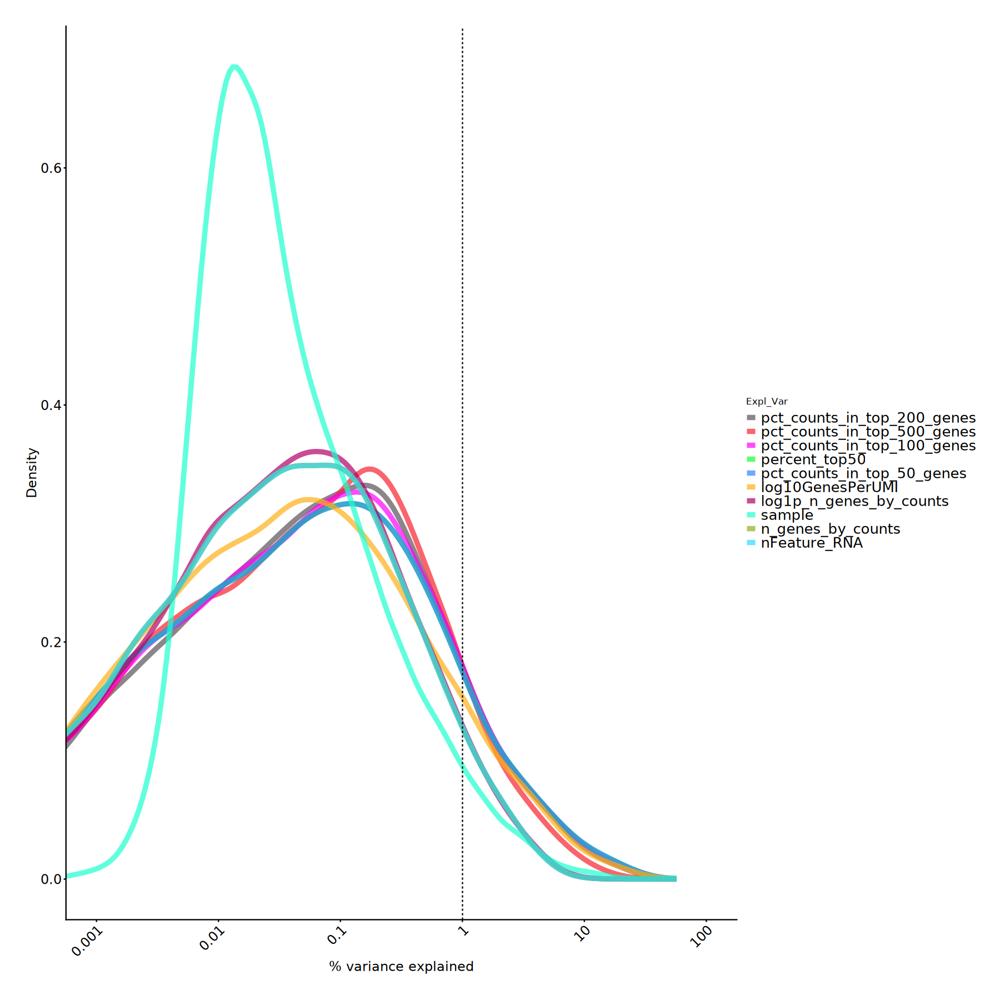

In [51]:
# view top 10 factors that explain the variation in gene expression:

scater::plotExplanatoryVariables(vars, nvars_to_plot = 10) + 
ggplot2::scale_color_manual(values = my_colours) +
my_theme + my_margin

In [52]:
# total counts is the main driver.

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


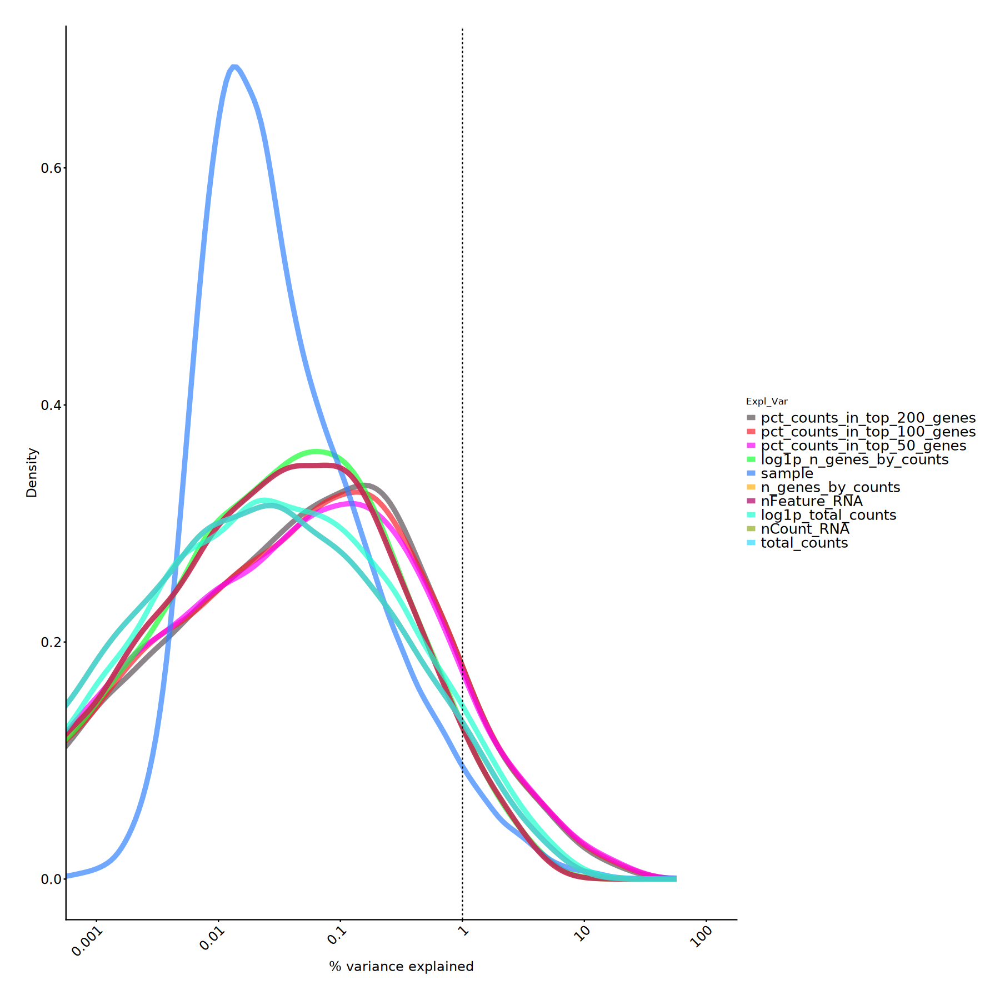

In [53]:
# view first 10 column:

scater::plotExplanatoryVariables(vars[, 1:10], nvars_to_plot = Inf) + 
ggplot2::scale_color_manual(values = my_colours) +
my_theme + my_margin

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message in transformation$transform(x):
"NaNs produced"
Warning message in scale_x_log10(breaks = 10^(-3:2), labels = c(0.001, 0.01, 0.1, :
"log-10 transformation introduced infinite values."
Warning message:
"Removed 2 rows containing non-finite outside the scale range
(`stat_density()`)."


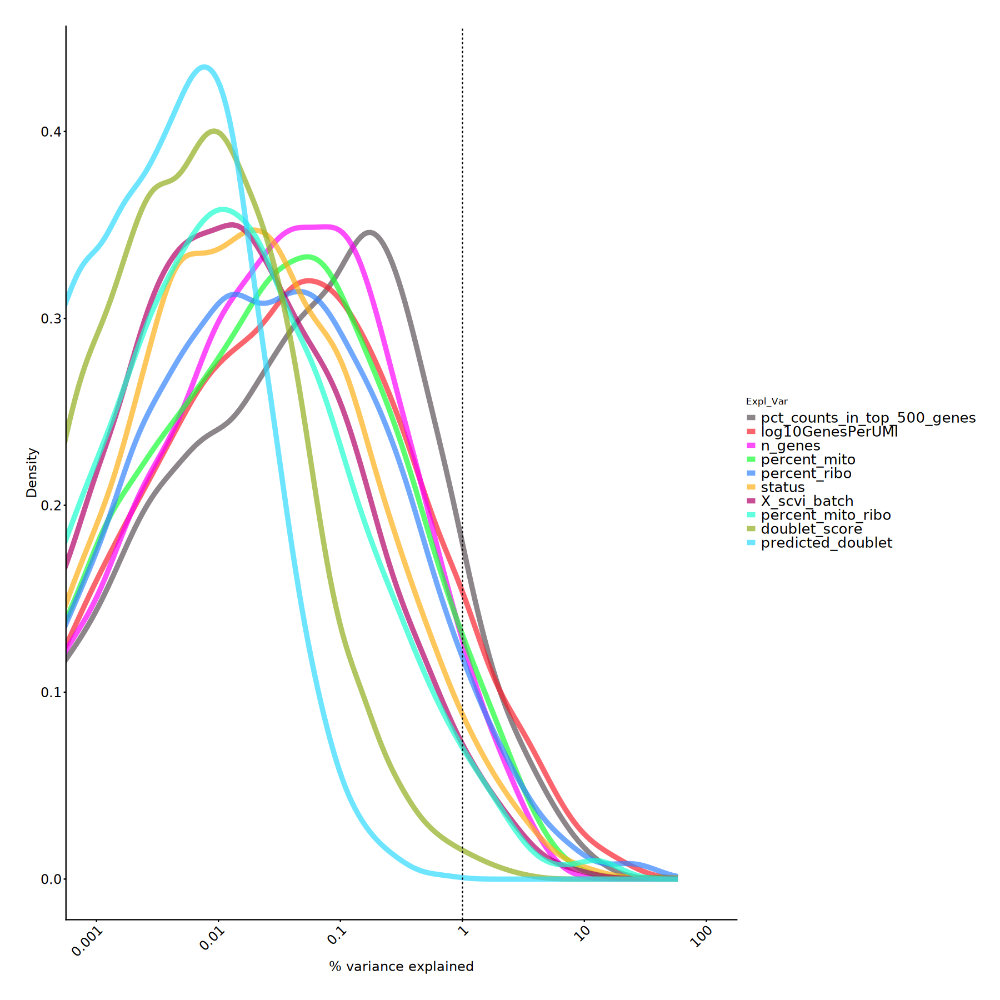

In [54]:
# second 10 columns:

scater::plotExplanatoryVariables(vars[, 11:20], nvars_to_plot = Inf) + 
ggplot2::scale_color_manual(values = my_colours) +
my_theme + my_margin

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


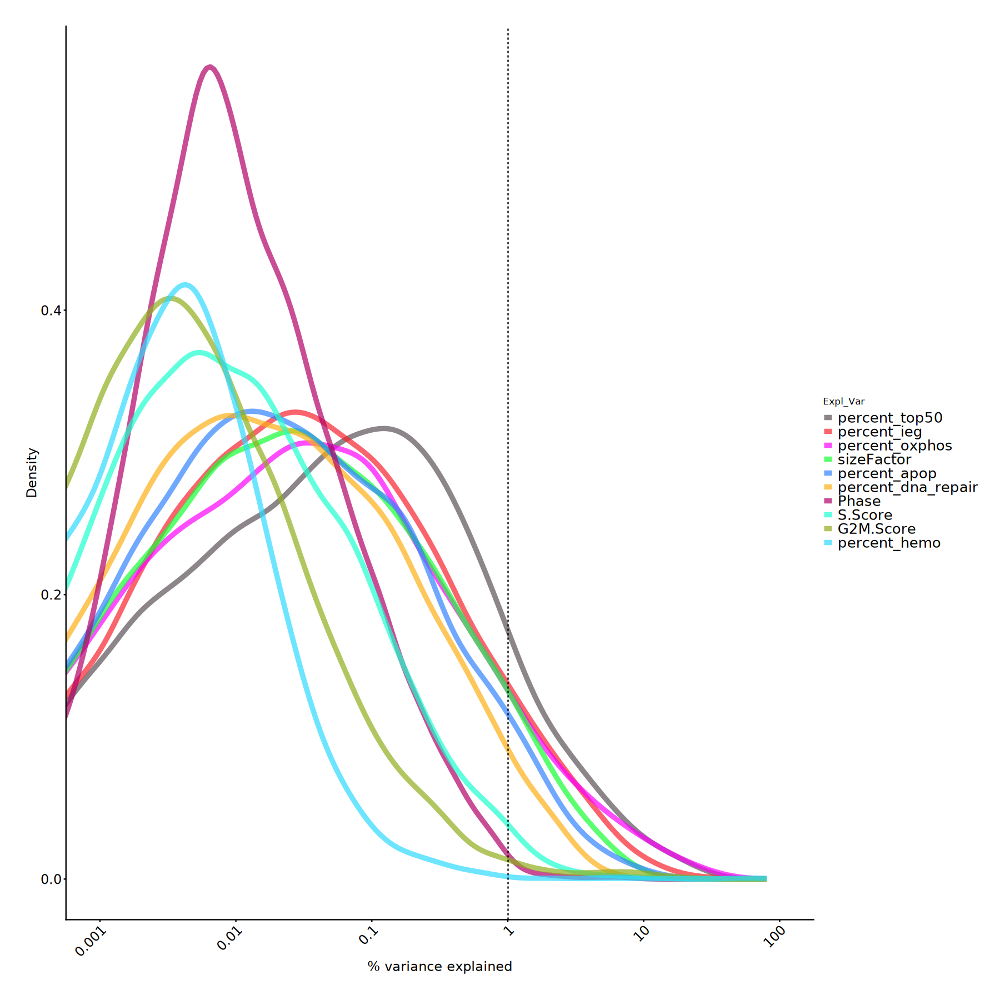

In [55]:
# last 10 columns:

scater::plotExplanatoryVariables(vars[, 21:30], nvars_to_plot = Inf) + 
ggplot2::scale_color_manual(values = my_colours) +
my_theme + my_margin

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Warning message in transformation$transform(x):
"NaNs produced"
Warning message in scale_x_log10(breaks = 10^(-3:2), labels = c(0.001, 0.01, 0.1, :
"log-10 transformation introduced infinite values."
Warning message:
"Removed 2 rows containing non-finite outside the scale range
(`stat_density()`)."


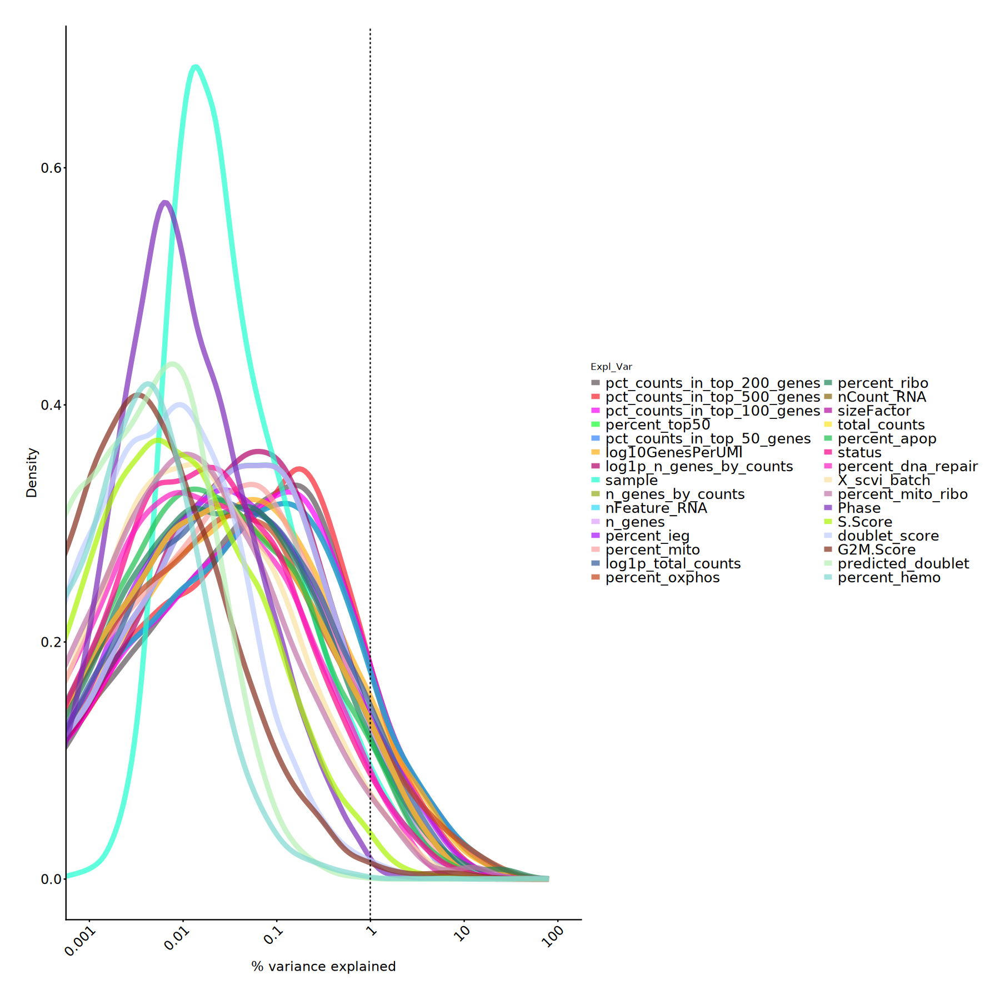

In [56]:
# view all columns:

scater::plotExplanatoryVariables(vars, nvars_to_plot = Inf) + 
ggplot2::scale_color_manual(values = my_colours) +
my_theme + my_margin

In [57]:
# according to chatGPT, the plotting function log10-transformes the R^2 values
# that range between 0 (0 variance) to 1 (100 % variance). It plots these
# transformed values. However, at x axis, it labels the ticks with the actual 
# untransformed R^2 values. Therefore, x = 1 means the 100 % of variance explained.
# More than this likely shows overfitting of the models or some other issues.

In [58]:
# log10 transfromation enables a more interpretable view by compressing
# the curve around short variance values and allow to distinguish higher
# variance values. 

In [59]:
# X-axis (Horizontal): % variance explained - This axis represents the percentage of variance
# in the data that is explained by each feature.  It's on a logarithmic scale 
# (notice the uneven spacing: 0.001, 0.01, 0.1, 1, 10, 100).  Logarithmic scales 
# are used when data spans several orders of magnitude, 
# making it easier to visualize both small and large values.

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


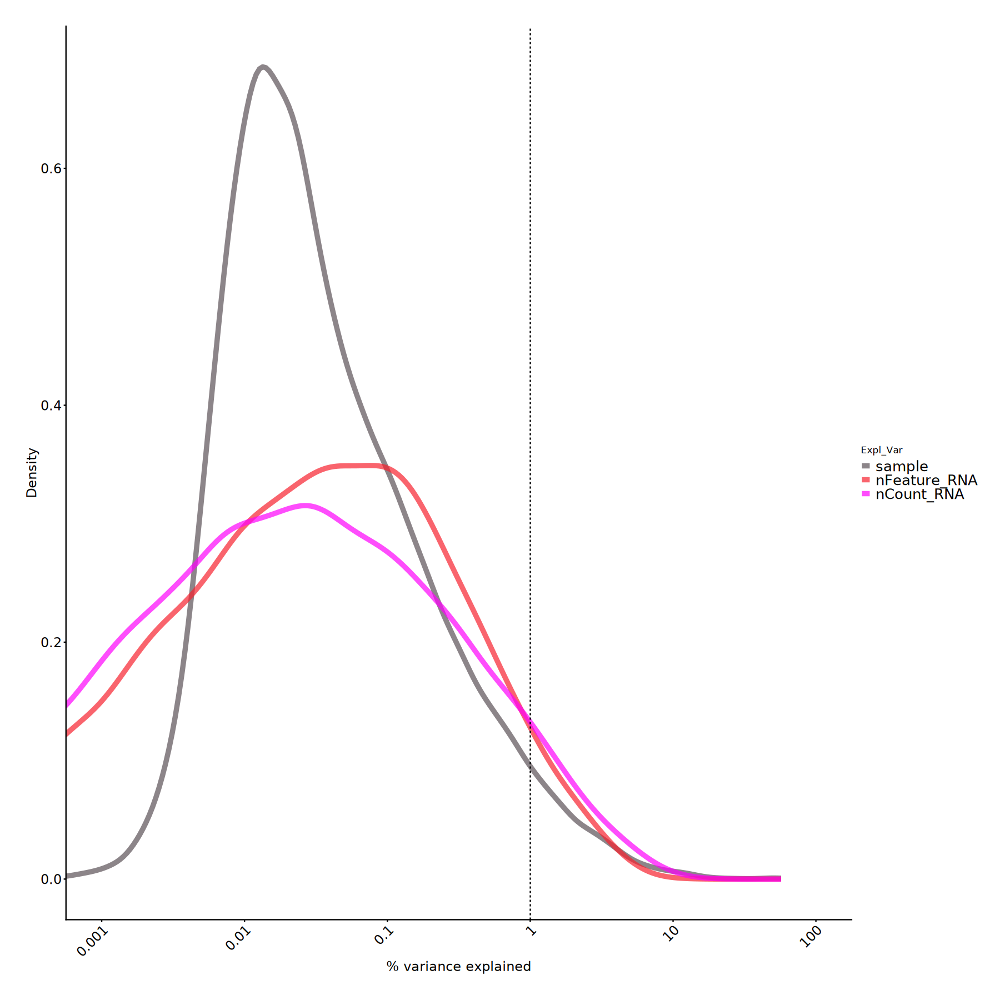

In [60]:
# view the three important categorical variables:

scater::plotExplanatoryVariables(vars[, c('nFeature_RNA', 'nCount_RNA', 'sample')], nvars_to_plot = Inf) + 
ggplot2::scale_color_manual(values = my_colours) +
my_theme + my_margin

In [76]:
zheng_et_al_sce$sample %>% table()

.
GSM5319987_sham1_ GSM5319988_sham2_ GSM5319989_sham3_ GSM5319990_MCAO1_ 
             8771              8540              9980             11772 
GSM5319991_MCAO2_ GSM5319992_MCAO3_ 
            11361              8104 

In [77]:
zheng_et_al_sce$status %>% table()

.
  control treatment 
    27291     31237 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


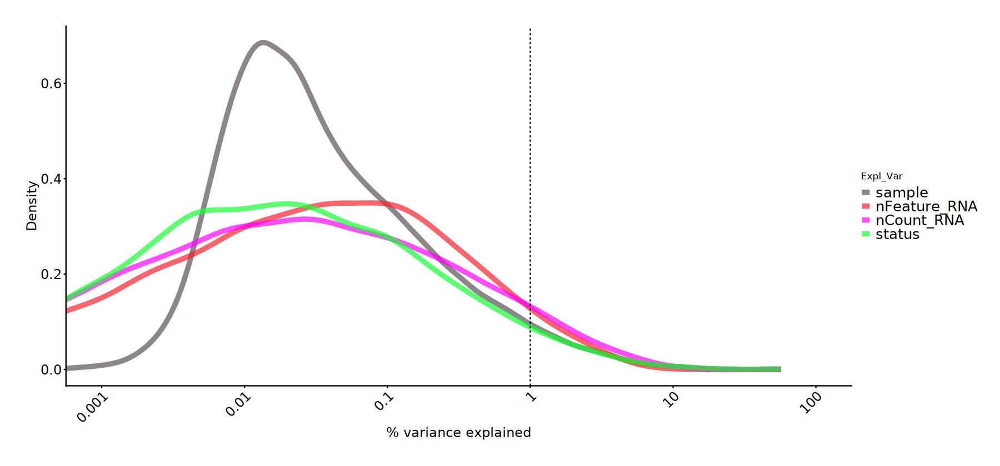

In [79]:
# view along with status:

scater::plotExplanatoryVariables(vars[, c('nFeature_RNA', 'nCount_RNA', 'sample', 'status')], nvars_to_plot = Inf) + 
ggplot2::scale_color_manual(values = my_colours) +
my_theme + my_margin

In [80]:
# model gene variation using scran to see the trend of mean-variance relation:

dec <- scran::modelGeneVar(zheng_et_al_sce)

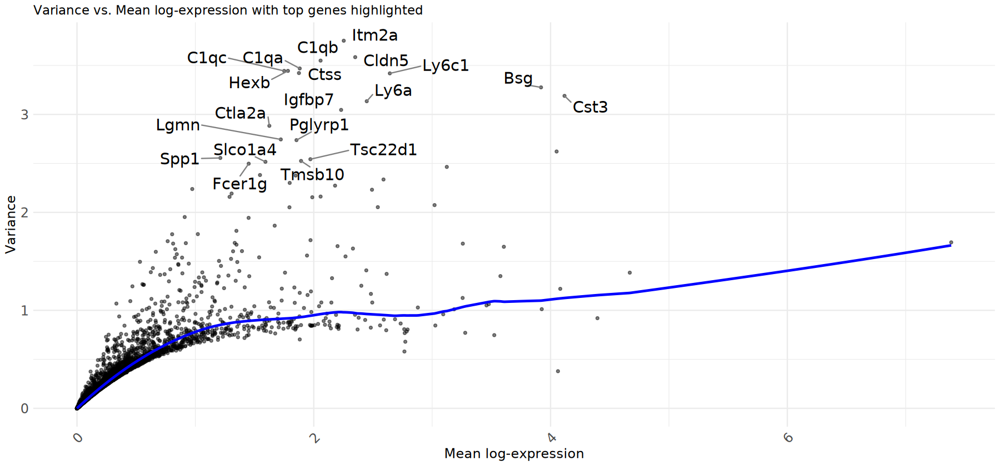

In [81]:

# Base data frame
df <- data.frame(
  mean = dec$mean,
  total = dec$total,
  gene = rownames(dec)
)

# Compute expected variance from trend
trend_fun <- S4Vectors::metadata(dec)$trend
df$expected <- trend_fun(df$mean)
df$residual <- df$total - df$expected

# Identify top N genes above the trend
top_n <- 20
top_genes <- df[order(df$residual, decreasing = TRUE)[1:top_n], ]

# Create smoothed trend line data
x_grid <- seq(min(df$mean), max(df$mean), length.out = 500)
trend_df <- data.frame(
  mean = x_grid,
  fitted = trend_fun(x_grid)
)

options(repr.plot.width = 15, repr.plot.height = 7)

# Final ggplot
ggplot2::ggplot(df, ggplot2::aes(x = mean, y = total)) +
  ggplot2::geom_point(alpha = 0.5, size = 1) +
  ggplot2::geom_line(data = trend_df,
                     ggplot2::aes(x = mean, y = fitted),
                     color = "blue", linewidth = 1) +
  ggrepel::geom_text_repel(data = top_genes,
                           ggplot2::aes(label = gene),
                           size = 6, max.overlaps = Inf, box.padding = 0.5,
                           segment.color = "grey50") +
  ggplot2::labs(
    x = "Mean log-expression",
    y = "Variance",
    title = "Variance vs. Mean log-expression with top genes highlighted"
  ) +
  ggplot2::theme_minimal() + my_theme

In [84]:
# Examine the distribution of continueous variables across cells from different samples:

In [85]:
zheng_et_al_seurat %>% slot('meta.data') %>% colnames() %>% print()

 [1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "_index"                     
 [5] "sample"                      "n_genes_by_counts"          
 [7] "log1p_n_genes_by_counts"     "total_counts"               
 [9] "log1p_total_counts"          "pct_counts_in_top_50_genes" 
[11] "pct_counts_in_top_100_genes" "pct_counts_in_top_200_genes"
[13] "pct_counts_in_top_500_genes" "n_genes"                    
[15] "doublet_score"               "predicted_doublet"          
[17] "status"                      "_scvi_batch"                
[19] "_scvi_labels"                "percent_mito"               
[21] "percent_ribo"                "percent_mito_ribo"          
[23] "log10GenesPerUMI"            "percent_top50"              
[25] "percent_oxphos"              "percent_apop"               
[27] "percent_dna_repair"          "percent_ieg"                
[29] "percent_hemo"                "S.Score"                    
[31] "G2M.Score"         

In [89]:
library(ggplot2)

In [90]:
options(repr.plot.width = 15, repr.plot.height = 7)

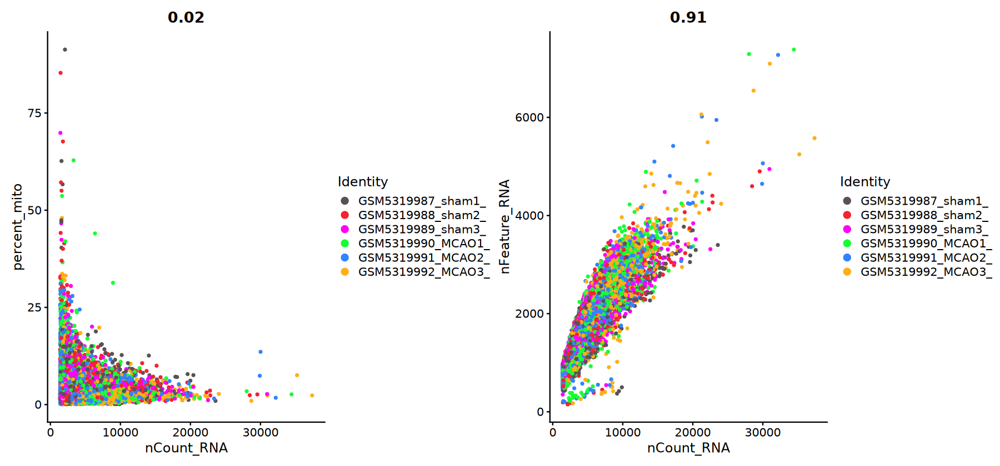

In [91]:
plot1 <- FeatureScatter(zheng_et_al_seurat, 
                        feature1 = "nCount_RNA", 
                        feature2 = "percent_mito", 
                        group.by = 'sample', 
                        shuffle = TRUE) + 
         scale_color_manual(values = my_colours) + 
         guides(colour = guide_legend(override.aes = list(size=3)))  

plot2 <- FeatureScatter(zheng_et_al_seurat, 
                        feature1 = "nCount_RNA", 
                        feature2 = "nFeature_RNA", 
                        group.by = 'sample', 
                        shuffle = TRUE) +
         scale_color_manual(values = my_colours) + 
         guides(colour = guide_legend(override.aes = list(size=3))) 

plot1 + plot2 & guides(colour = guide_legend(override.aes = list(size=3))) 

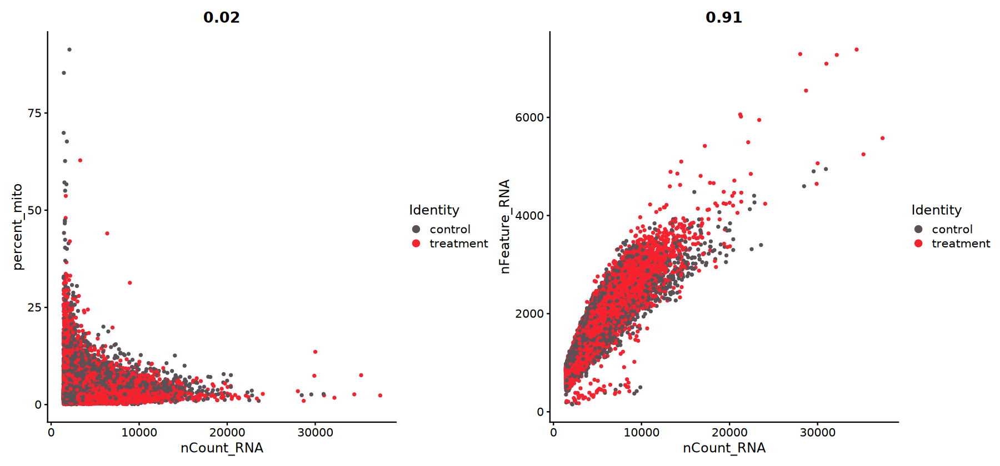

In [92]:
plot1 <- FeatureScatter(zheng_et_al_seurat, 
                        feature1 = "nCount_RNA", 
                        feature2 = "percent_mito", 
                        group.by = 'status', 
                        shuffle = TRUE) + 
         scale_color_manual(values = my_colours) + 
         guides(colour = guide_legend(override.aes = list(size=3)))  

plot2 <- FeatureScatter(zheng_et_al_seurat, 
                        feature1 = "nCount_RNA", 
                        feature2 = "nFeature_RNA", 
                        group.by = 'status', 
                        shuffle = TRUE) +
         scale_color_manual(values = my_colours) + 
         guides(colour = guide_legend(override.aes = list(size=3))) 

plot1 + plot2 & guides(colour = guide_legend(override.aes = list(size=3))) 

In [93]:
zheng_et_al_seurat %>% 
slot('meta.data') %>% 
with(table(sample, status))

                   status
sample              control treatment
  GSM5319987_sham1_    8771         0
  GSM5319988_sham2_    8540         0
  GSM5319989_sham3_    9980         0
  GSM5319990_MCAO1_       0     11772
  GSM5319991_MCAO2_       0     11361
  GSM5319992_MCAO3_       0      8104

In [114]:
Matrix::colSums(Seurat::GetAssayData(zheng_et_al_seurat, assay = "RNA", layer = "counts")) %>% head()

AAACCTGAGCGAAGGG-1-GSM5319988_sham2_ AAACCTGAGCTAACAA-1-GSM5319988_sham2_ 
                                1438                                 1603 
AAACCTGAGGCTAGCA-1-GSM5319988_sham2_ AAACCTGAGGTGCACA-1-GSM5319988_sham2_ 
                                2384                                 2906 
AAACCTGAGTTTAGGA-1-GSM5319988_sham2_ AAACCTGCAACACGCC-1-GSM5319988_sham2_ 
                                2928                                 2153

In [115]:
zheng_et_al_seurat %>% use_series(nCount_RNA) %>% head()

AAACCTGAGCGAAGGG-1-GSM5319988_sham2_ AAACCTGAGCTAACAA-1-GSM5319988_sham2_ 
                                1438                                 1603 
AAACCTGAGGCTAGCA-1-GSM5319988_sham2_ AAACCTGAGGTGCACA-1-GSM5319988_sham2_ 
                                2384                                 2906 
AAACCTGAGTTTAGGA-1-GSM5319988_sham2_ AAACCTGCAACACGCC-1-GSM5319988_sham2_ 
                                2928                                 2153

In [116]:
identical(Matrix::colSums(Seurat::GetAssayData(zheng_et_al_seurat, assay = "RNA", layer = "counts")), 
         zheng_et_al_seurat %>% use_series(nCount_RNA))

[1] TRUE

In [155]:
plot_read_count_knee_from_BPCells <- function(read_counts, cutoff = NULL, return_data = FALSE, apply_styling = TRUE) {
  
  # Message to inform the user about how the cutoff should be provided
  message('if used cutoff, make sure to provide it in e3 format (1e3 etc.) ')
  
  # Step 1: Prepare ranks for plotting. We want to keep ~1k cells per order of magnitude
  # We calculate unique ranks using a logarithmic scale. This helps in speeding up plotting by reducing the number of points.
  # floor(10^(1:(1000 * ceiling(log10(length(read_counts)))) / 1000)) will generate a sequence of ranks.
  ranks <- unique(floor(10^(1:(1000 * ceiling(log10(length(read_counts)))) / 1000)))
  
  # Step 2: Prepare the data frame for plotting
  data <- list(
    # Create a tibble that contains 'ranks' and 'reads'
    data = tibble::tibble(
      ranks = ranks[ranks < length(read_counts)],  # Ensure ranks do not exceed the number of read counts
      reads = sort(read_counts, decreasing = TRUE)[ranks]  # Sort read counts in descending order and select by ranks
    ),
    cells_passing = NA  # Initialize 'cells_passing' as NA (we'll compute this if cutoff is provided)
  )
  
  # Step 3: If cutoff is provided, calculate the number of cells passing the cutoff
  # This step counts how many cells have a read count greater than the specified cutoff
  if (!is.null(cutoff)) {
    data$cells_passing <- sum(read_counts > cutoff)
  }
  
  # Step 4: If return_data is TRUE, return the prepared data (without plotting)
  if (return_data) {
    return(data)
  }

  # Step 5: Plotting the data using ggplot2
  # ggplot creates a scatter plot where the x-axis is the log10 of the ranks and y-axis is the log10 of the reads
  plot <- ggplot2::ggplot(data$data, ggplot2::aes(log10(ranks), log10(reads))) +
    ggplot2::geom_point() +  # Add points to the plot

    # Formatting the axes: Set breaks on the x and y axes for clarity and use log10 scaling
    ggplot2::scale_x_continuous(labels = scales::label_math(), breaks = scales::breaks_width(1)) +
    ggplot2::scale_y_continuous(labels = scales::label_math(), breaks = scales::breaks_width(1))

  # Step 6: Label the axes with appropriate descriptions
  plot <- plot + ggplot2::labs(x = "Barcode Rank", y = "Reads")

  # Step 7: If apply_styling is FALSE, return the plot without applying further styling
  if (!apply_styling) {
    return(plot)
  }

  # Step 8: If cutoff is provided, enhance the plot with additional elements:
  #  - Add a shaded rectangle indicating cells that pass the cutoff
  #  - Add a dashed horizontal line at the cutoff level
  #  - Add a label displaying the number of cells passing the cutoff
  
  if (!is.null(cutoff)) {
    # Create a label that will display the number of cells passing the cutoff
    cell_label <- tibble::tibble(
      label = sprintf("%s cells", scales::label_comma()(data$cells_passing)),  # Format label for cell count
      x = max(log10(data$data$ranks)),  # Position the label at the max rank value
      y = max(log10(data$data$reads))  # Position the label at the max read count value
    )
    
    # Define the rectangle that will highlight the area above the cutoff threshold
    rectangle_highlight <- tibble::tibble(
      xmin = -Inf, xmax = Inf,  # Set the rectangle to span the entire width of the plot
      ymin = log10(cutoff), ymax = Inf  # The rectangle will start at the log10 of the cutoff value and extend upwards
    )
    
    # Add the cutoff line, label, and rectangle to the plot
    plot <- plot +
      ggplot2::geom_hline(yintercept = log10(cutoff), linetype = "dashed") +  # Dashed line at the cutoff level
      ggplot2::geom_text(data = cell_label, ggplot2::aes(x, y, label = label), hjust = "inward", vjust = "inward") +  # Add label for the number of passing cells
      ggplot2::geom_rect(
        ggplot2::aes(xmin = xmin, xmax = xmax, ymin = ymin, ymax = ymax, x = NULL, y = NULL),  # Draw the shaded rectangle
        data = rectangle_highlight,
        alpha = 0.1  # Set transparency of the shaded rectangle
      )
  }

  # Step 9: Final plot styling with log ticks and classic theme
  plot <- plot +
    ggplot2::annotation_logticks() +  # Add log scale ticks to both axes
    ggplot2::theme_classic()  # Use the classic ggplot2 theme for the plot
  
  # Step 10: Return the final plot
  return(plot)
}

if used cutoff, make sure to provide it in e3 format (1e3 etc.) 



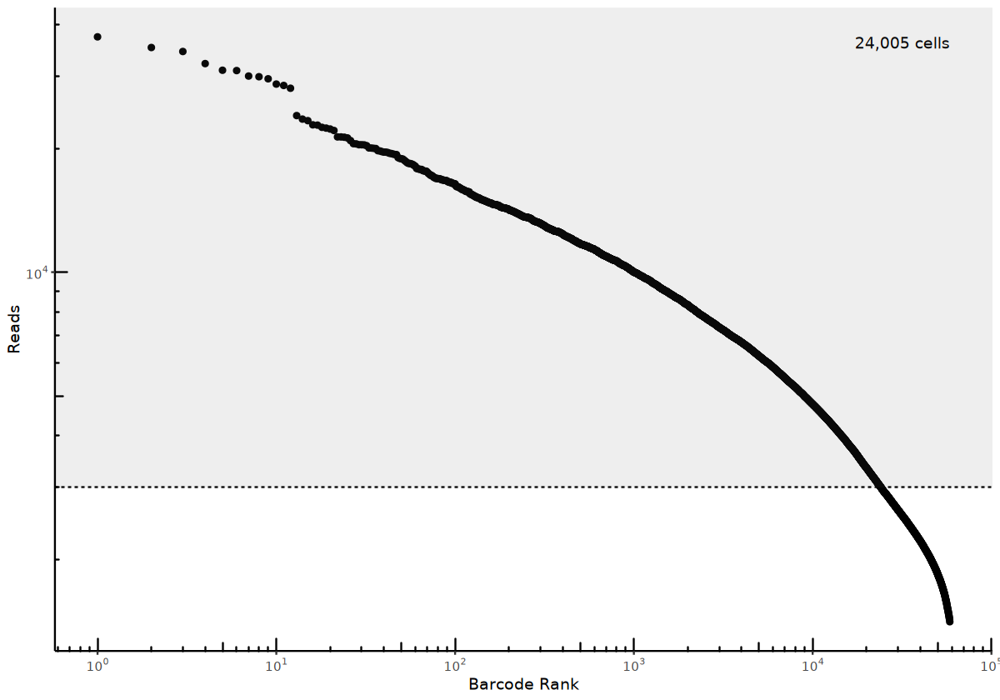

In [156]:
plot_read_count_knee_from_BPCells(read_counts = zheng_et_al_seurat$nCount_RNA, cutoff = 3e3)

In [157]:
options(repr.plot.width = 20, repr.plot.height = 15)

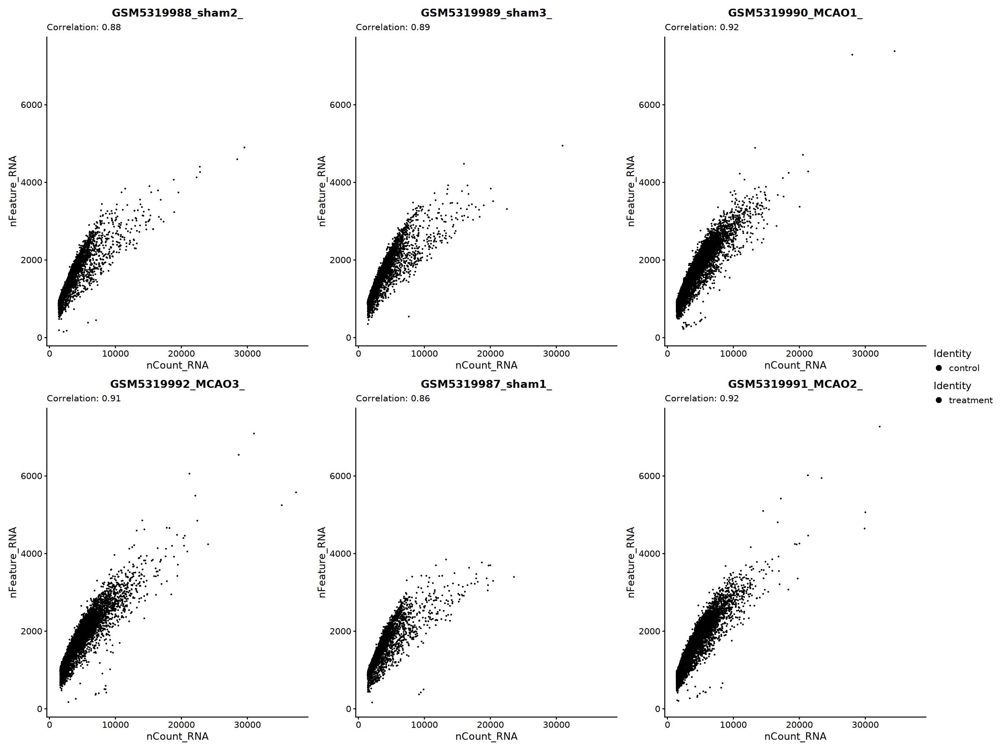

In [161]:
scCustomize::FeatureScatter_scCustom(zheng_et_al_seurat,
                                     group.by = 'status', 
                                     colors_use = list( 'black', 'red'),
                                     feature1 = "nCount_RNA", 
                                     feature2 = "nFeature_RNA", 
                                     shuffle = TRUE, 
                                     split.by = 'sample', 
                                     num_columns = 3) & guides(colour = guide_legend(override.aes = list(size=3))) 

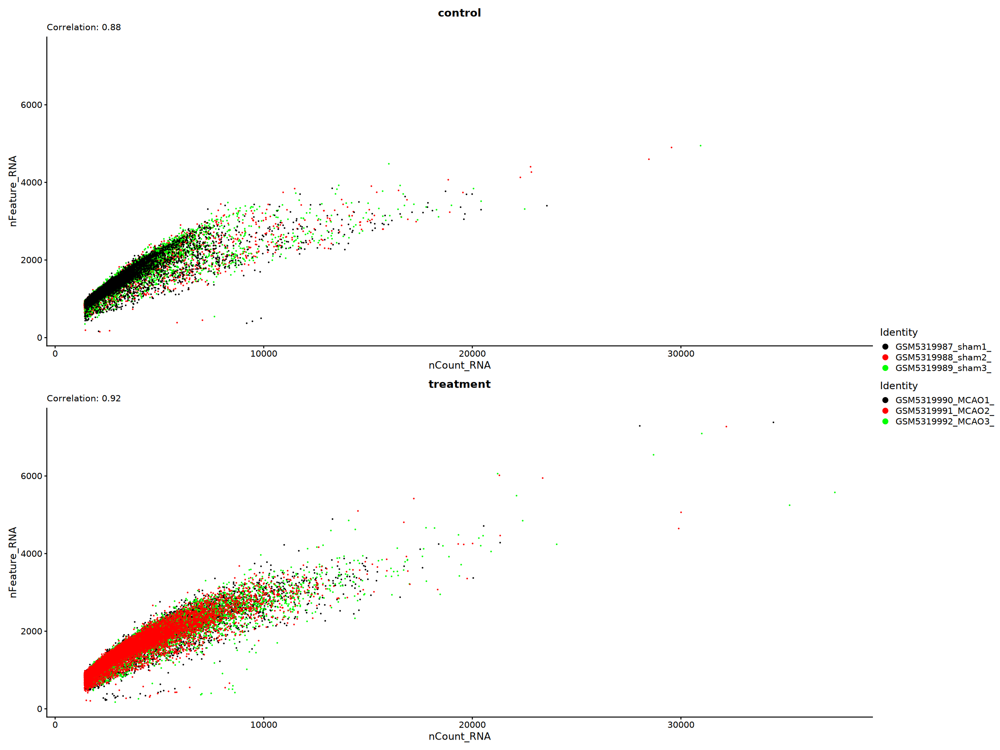

In [164]:
scCustomize::FeatureScatter_scCustom(zheng_et_al_seurat,
                                     group.by = 'sample', 
                                     colors_use = list( 'black', 'red', 'green'),
                                     feature1 = "nCount_RNA", 
                                     feature2 = "nFeature_RNA", 
                                     shuffle = TRUE, 
                                     split.by = 'status', 
                                     num_columns = 1) & guides(colour = guide_legend(override.aes = list(size=3))) 

In [174]:
options(repr.plot.width = 15, repr.plot.height = 7)

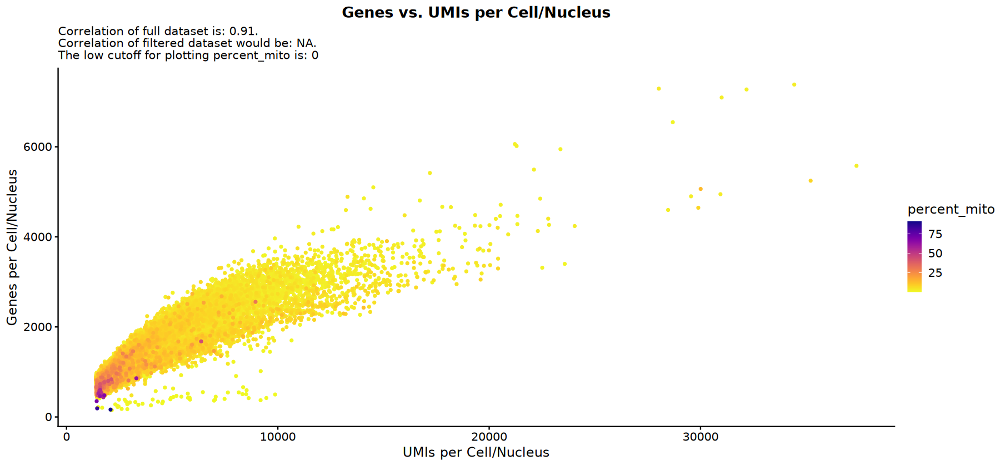

In [176]:
scCustomize::QC_Plot_UMIvsGene(seurat_object = zheng_et_al_seurat,
                               meta_gradient_name = "percent_mito")

In [184]:
sample_names <- zheng_et_al_seurat$sample %>% unique() %>% sort()

In [185]:
sample_names %>% sort()

[1] "GSM5319987_sham1_" "GSM5319988_sham2_" "GSM5319989_sham3_"
[4] "GSM5319990_MCAO1_" "GSM5319991_MCAO2_" "GSM5319992_MCAO3_"

In [186]:
plot_list <- list()

for (each_sample in sample_names) {

    plot_list[[each_sample]] <- scCustomize::QC_Plot_UMIvsGene(seurat_object = zheng_et_al_seurat %>% subset(subset = sample %in% each_sample),
                               meta_gradient_name = "percent_mito") + ggtitle(each_sample)

}

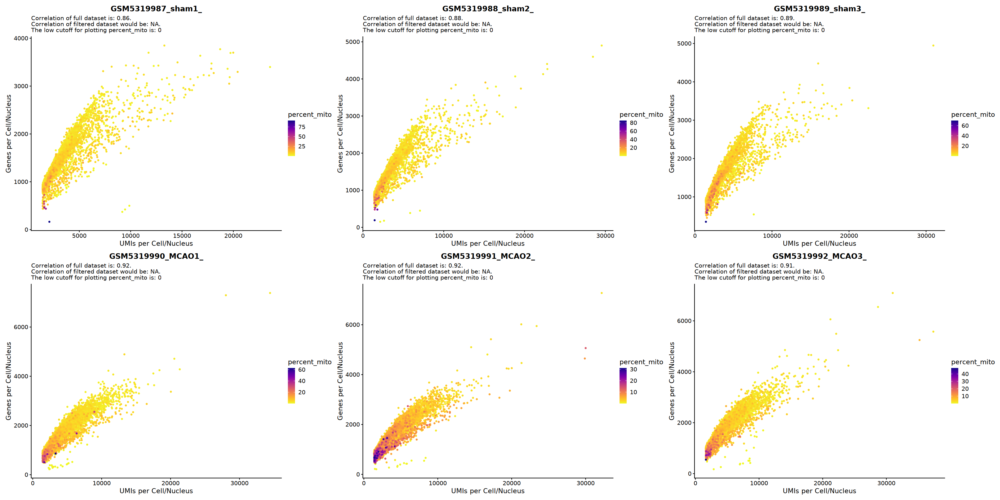

In [187]:
options(repr.plot.width = 30, repr.plot.height = 15)

patchwork::wrap_plots(plot_list, ncol = 3)

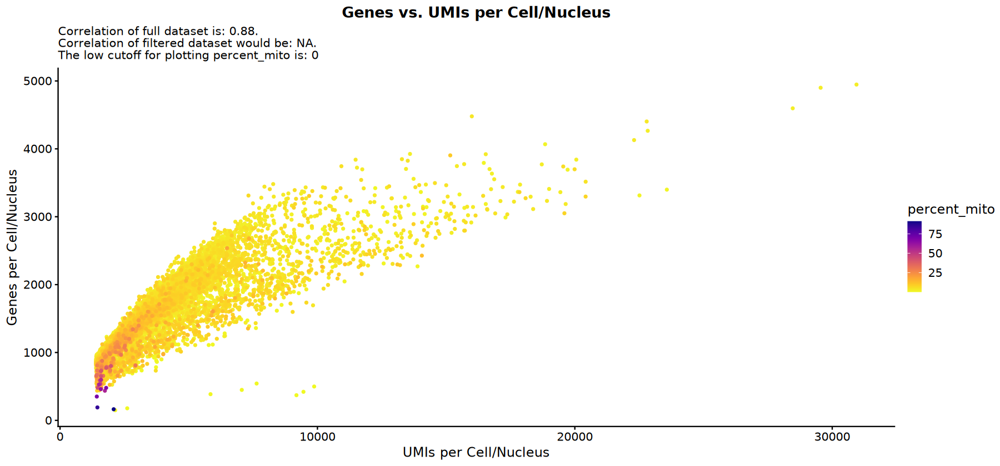

In [190]:
options(repr.plot.width = 15, repr.plot.height = 7)

scCustomize::QC_Plot_UMIvsGene(seurat_object = zheng_et_al_seurat %>% subset(subset = status %in% 'control'),
                               meta_gradient_name = "percent_mito")

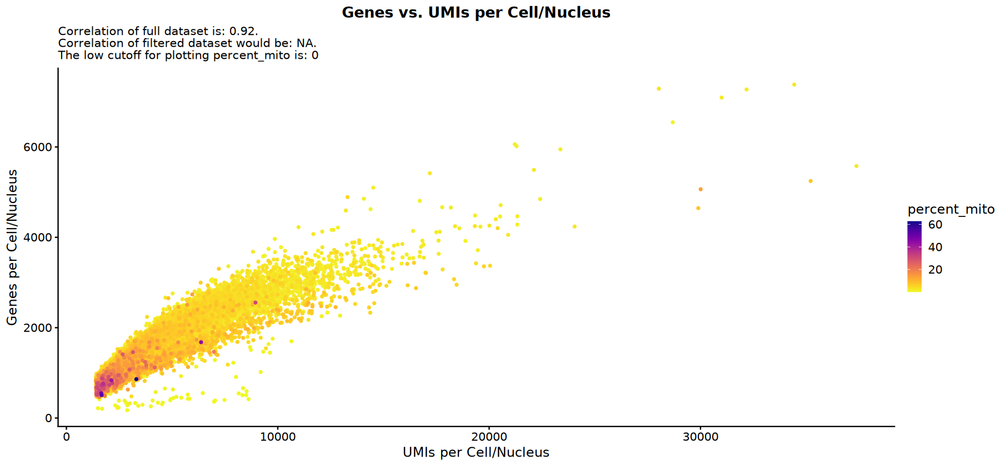

In [191]:
scCustomize::QC_Plot_UMIvsGene(seurat_object = zheng_et_al_seurat %>% subset(subset = status %in% 'treatment'),
                               meta_gradient_name = "percent_mito")

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."


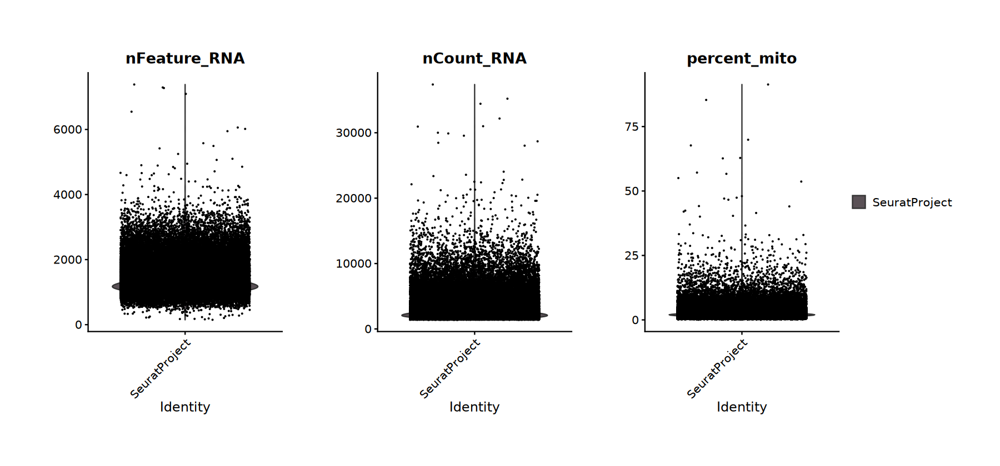

In [203]:
VlnPlot(zheng_et_al_seurat, 
        features = c("nFeature_RNA", "nCount_RNA", "percent_mito"), 
        # pt.size = 0, 
        cols = my_colours) + 
        theme(legend.position = "right") & my_margin

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."


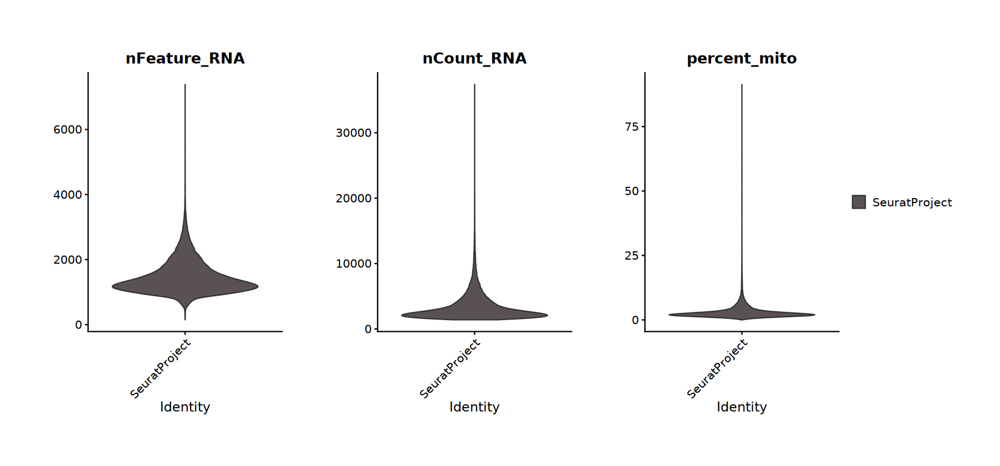

In [204]:
VlnPlot(zheng_et_al_seurat, 
        features = c("nFeature_RNA", "nCount_RNA", "percent_mito"), 
        pt.size = 0, 
        cols = my_colours) + 
        theme(legend.position = "right") & my_margin

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."


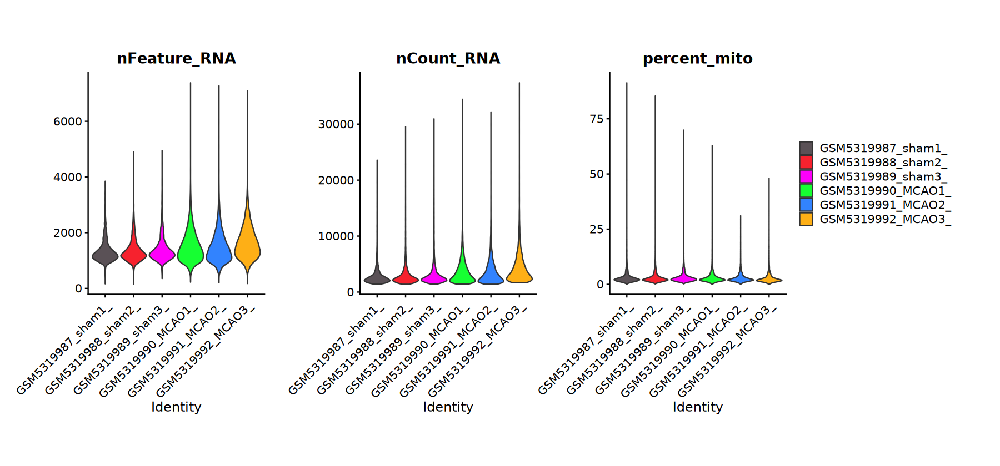

In [205]:
VlnPlot(zheng_et_al_seurat, 
        features = c("nFeature_RNA", "nCount_RNA", "percent_mito"), 
        group.by = 'sample' , 
        pt.size = 0, 
        cols = my_colours) + 
        theme(legend.position = "right") & my_margin

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."


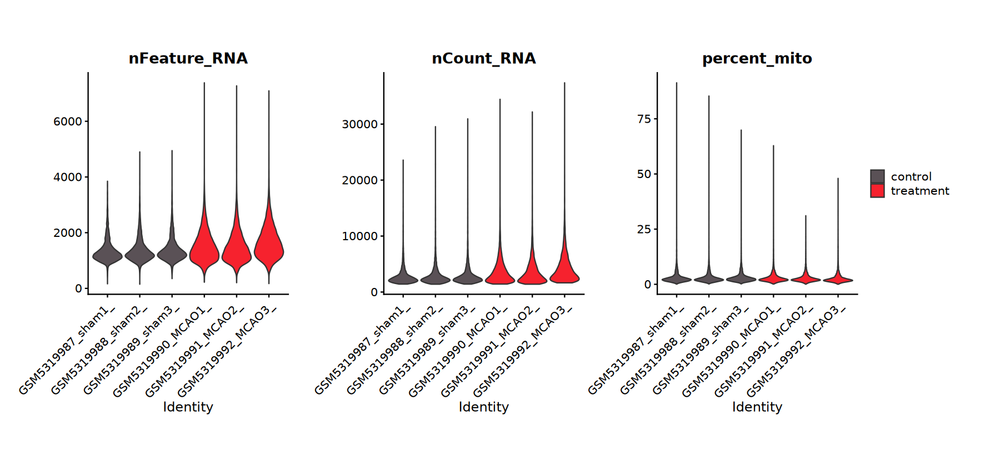

In [206]:
VlnPlot(zheng_et_al_seurat, 
        features = c("nFeature_RNA", "nCount_RNA", "percent_mito"), 
        group.by = 'sample' , 
        split.by = 'status',
        pt.size = 0, 
        cols = my_colours) + 
        theme(legend.position = "right") & my_margin

In [194]:
# Look with some cut off values:

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."


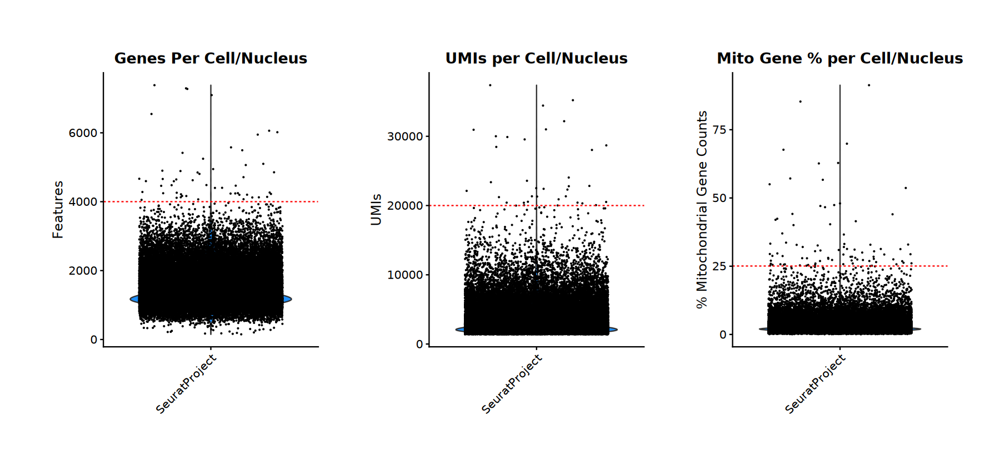

In [216]:
scCustomize::QC_Plots_Combined_Vln(seurat_object = zheng_et_al_seurat, 
                                   group.by = 'orig.ident',
                                   feature_cutoffs = c(0, 4000), 
                                   UMI_cutoffs = c(0, 20000), 
                                   mito_cutoffs = 25, 
                                   pt.size = 0.1) & my_margin

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."


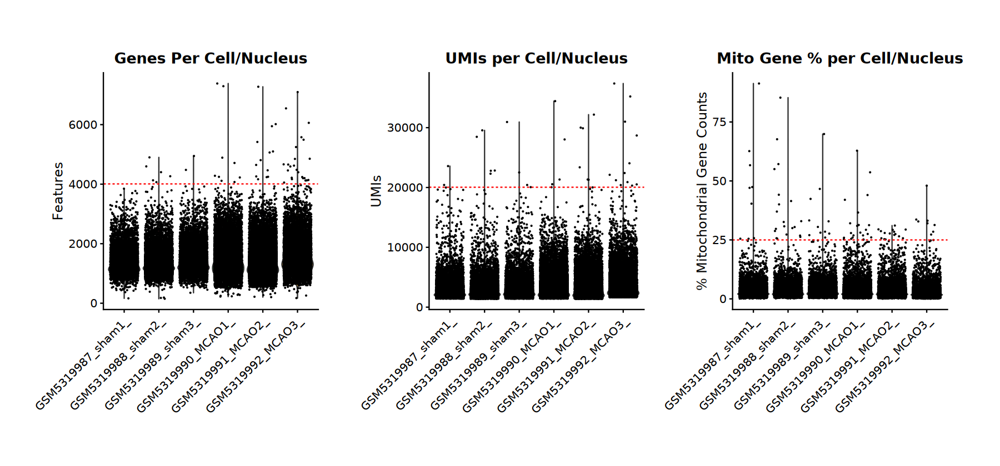

In [217]:
scCustomize::QC_Plots_Combined_Vln(seurat_object = zheng_et_al_seurat, 
                                   group.by = 'sample', 
                                   colors_use = my_colours, 
                                   pt.size = 0.1,
                                   feature_cutoffs = c(0, 4000), 
                                   UMI_cutoffs = c(0, 20000), 
                                   mito_cutoffs = 25, 
                                   ) & my_margin

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."


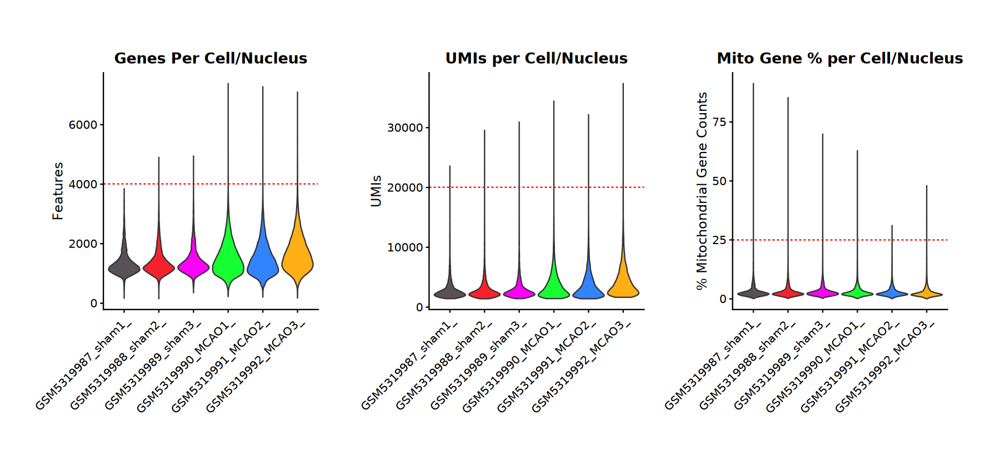

In [218]:
scCustomize::QC_Plots_Combined_Vln(seurat_object = zheng_et_al_seurat, 
                                   group.by = 'sample', 
                                   colors_use = my_colours, 
                                   pt.size = 0,
                                   feature_cutoffs = c(0, 4000), 
                                   UMI_cutoffs = c(0, 20000), 
                                   mito_cutoffs = 25, 
                                   ) & my_margin

Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."


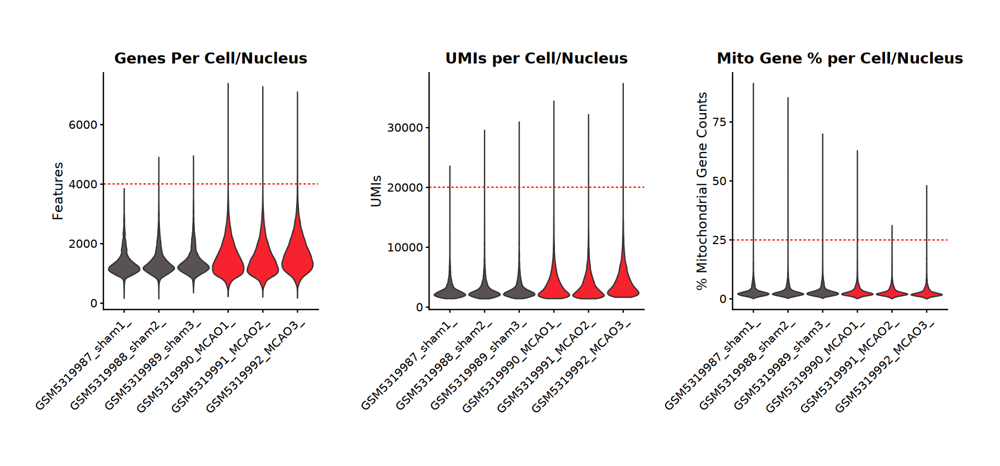

In [221]:
scCustomize::QC_Plots_Combined_Vln(seurat_object = zheng_et_al_seurat, 
                                   group.by = 'sample', 
                                   split.by = 'status',
                                   colors_use = my_colours, 
                                   pt.size = 0,
                                   feature_cutoffs = c(0, 4000), 
                                   UMI_cutoffs = c(0, 20000), 
                                   mito_cutoffs = 25, 
                                   ) & my_margin

    From scCustomize vignette:
    "Additional parameters:
    In addition to being able to supply Seurat parameters with ... these plots like many others in 
    scCustomize contain other additional parameters to customize plot output without need 
    for post-plot ggplot2 modifications.
    
    plot_title: Change plot title
    x_axis_label/y_axis_label: Change axis labels.
    x_lab_rotate: Should x-axis label be rotated 45 degrees?
    y_axis_log: Should y-axis in linear or log10 scale.
    plot_median & median_size: Plot a line at the median of each x-axis identity.
    plot_boxplot: Plot boxplot on top of the violin."

Warning message:
"Provided value for `pt.size` (0) will be ignored.
When setting plot_boxplot = TRUE, `pt.size` is automatically set to 0."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Provided value for `pt.size` (0) will be ignored.
When setting plot_boxplot = TRUE, `pt.size` is automatically set to 0."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Provided value for `pt.size` (0) will be ignored.
When setting plot_boxplot = TRUE, `pt.size` is automatically set to 0."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`)."
Warning message:
"Removed 1 row containing missing values or values outside the scale range
(`geom_hline()`).

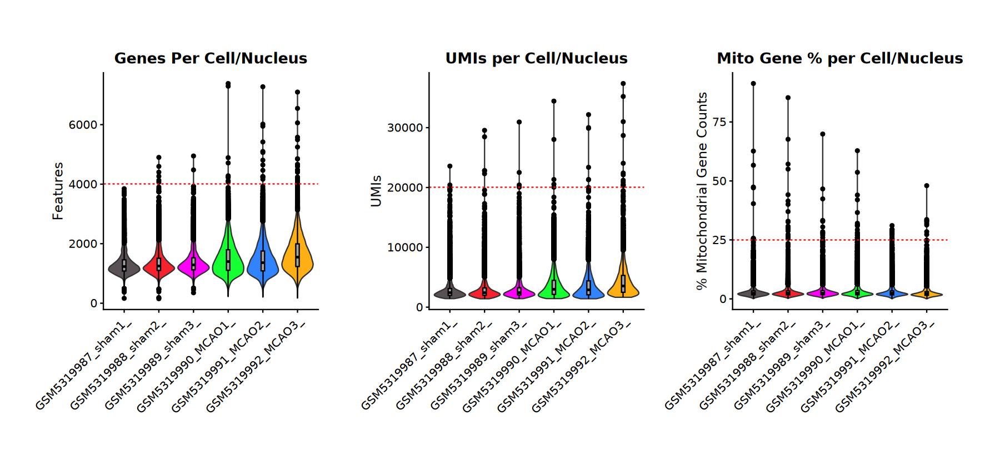

In [222]:
scCustomize::QC_Plots_Combined_Vln(seurat_object = zheng_et_al_seurat, 
                                   plot_boxplot = TRUE,
                                   group.by = 'sample', 
                                   colors_use = my_colours, 
                                   pt.size = 0,
                                   feature_cutoffs = c(0, 4000), 
                                   UMI_cutoffs = c(0, 20000), 
                                   mito_cutoffs = 25, 
                                   ) & my_margin

Warning message:
"Provided value for `pt.size` (0) will be ignored.
When setting plot_boxplot = TRUE, `pt.size` is automatically set to 0."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message:
"Provided value for `pt.size` (0) will be ignored.
When setting plot_boxplot = TRUE, `pt.size` is automatically set to 0."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message:
"Provided value for `pt.size` (0) will be ignored.
When setting plot_boxplot = TRUE, `pt.size` is automatically set to 0."
Warning message:
"Default search for "data" layer in "RNA" assay yielded no results; utilizing "counts" layer instead."
Scale for y is already

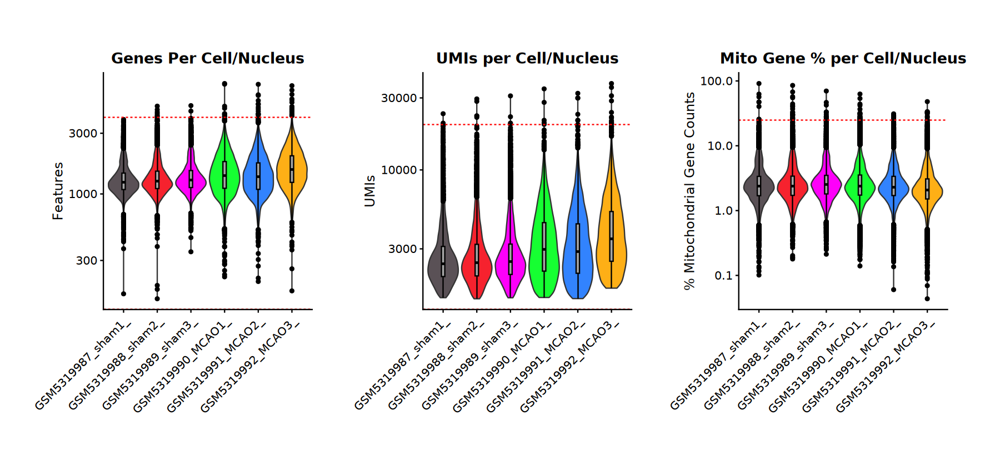

In [223]:
scCustomize::QC_Plots_Combined_Vln(seurat_object = zheng_et_al_seurat, 
                                   y_axis_log = TRUE,
                                   plot_boxplot = TRUE,
                                   group.by = 'sample', 
                                   colors_use = my_colours, 
                                   pt.size = 0,
                                   feature_cutoffs = c(0, 4000), 
                                   UMI_cutoffs = c(0, 20000), 
                                   mito_cutoffs = 25, 
                                   ) & my_margin

In [101]:
options(repr.plot.width = 15, repr.plot.height = 7)

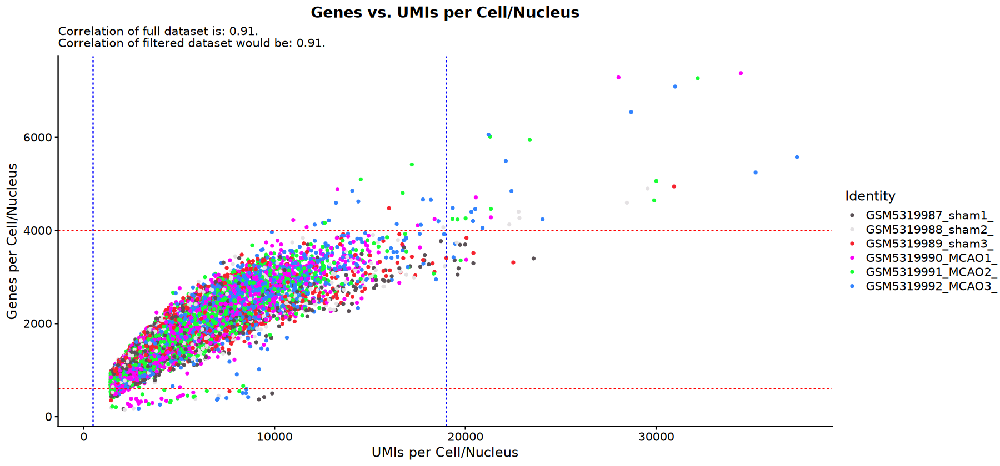

In [226]:
scCustomize::QC_Plot_UMIvsGene(seurat_object = zheng_et_al_seurat, 
                               group.by = 'sample',
                               low_cutoff_gene = 600, 
                               high_cutoff_gene = 4000, 
                               low_cutoff_UMI = 500,
                               high_cutoff_UMI = 19000)

In [229]:
plot_list <- list()

for (each_sample in sample_names) {

    plot_list[[each_sample]] <- scCustomize::QC_Plot_UMIvsGene(
                               seurat_object = zheng_et_al_seurat %>% subset(subset = sample %in% each_sample), 
                               low_cutoff_gene = 600, 
                               high_cutoff_gene = 4000, 
                               low_cutoff_UMI = 500,
                               high_cutoff_UMI = 18000) + ggtitle(each_sample)
}

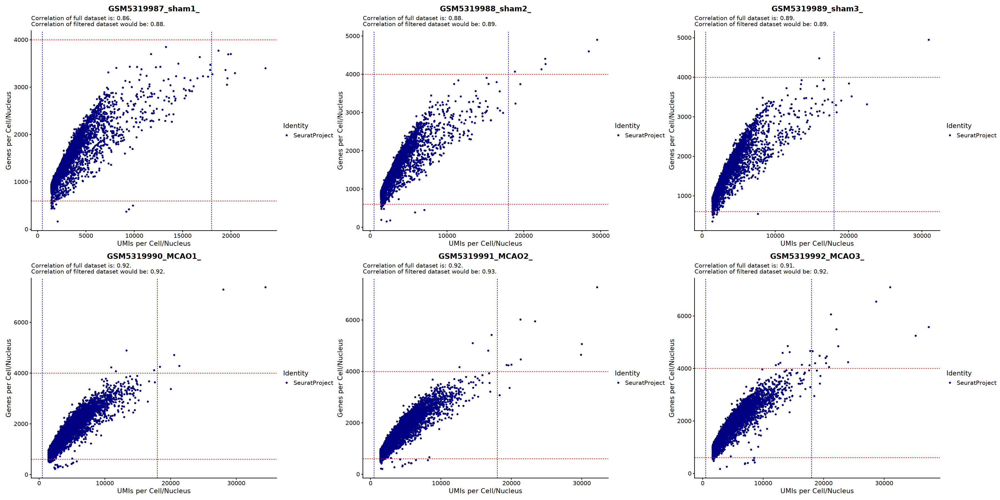

In [230]:
options(repr.plot.width = 30, repr.plot.height = 15)

patchwork::wrap_plots(plot_list, ncol = 3)

In [231]:
options(repr.plot.width = 15, repr.plot.height = 7)

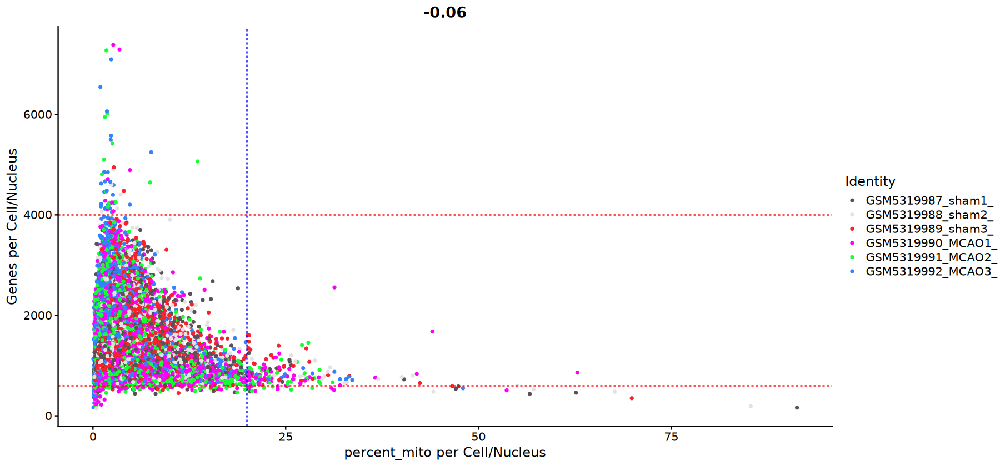

In [232]:
scCustomize::QC_Plot_GenevsFeature(seurat_object = zheng_et_al_seurat, 
                                   feature1 = "percent_mito", 
                                   group.by = 'sample',
                                   low_cutoff_gene = 600,
                                   high_cutoff_gene = 4000, 
                                   high_cutoff_feature = 20)

In [234]:
plot_list <- list()

for (each_sample in sample_names) {

    plot_list[[each_sample]] <- scCustomize::QC_Plot_GenevsFeature(
                                   seurat_object = zheng_et_al_seurat %>% subset(subset = sample %in% each_sample), 
                                   feature1 = "percent_mito", 
                                   low_cutoff_gene = 600,
                                   high_cutoff_gene = 4000, 
                                   high_cutoff_feature = 20) + ggtitle(each_sample)
}

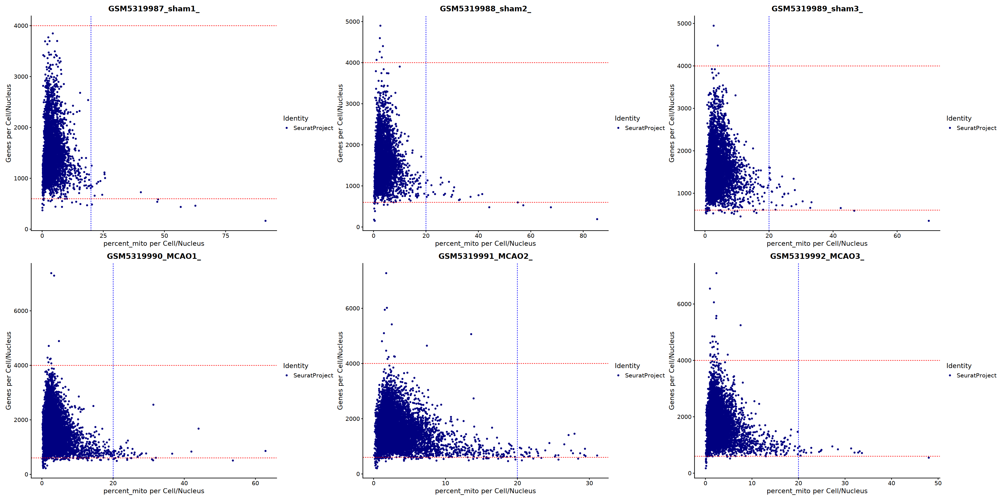

In [235]:
options(repr.plot.width = 30, repr.plot.height = 15)

patchwork::wrap_plots(plot_list, ncol = 3)

In [236]:
plot_list <- list()

for (each_sample in sample_names) {

    plot_list[[each_sample]] <- scCustomize::QC_Plot_UMIvsGene(seurat_object = zheng_et_al_seurat %>% subset(subset = sample %in% each_sample),
                                                               meta_gradient_low_cutoff = 20,
                                                               meta_gradient_name = "percent_mito") + ggtitle(each_sample)

}

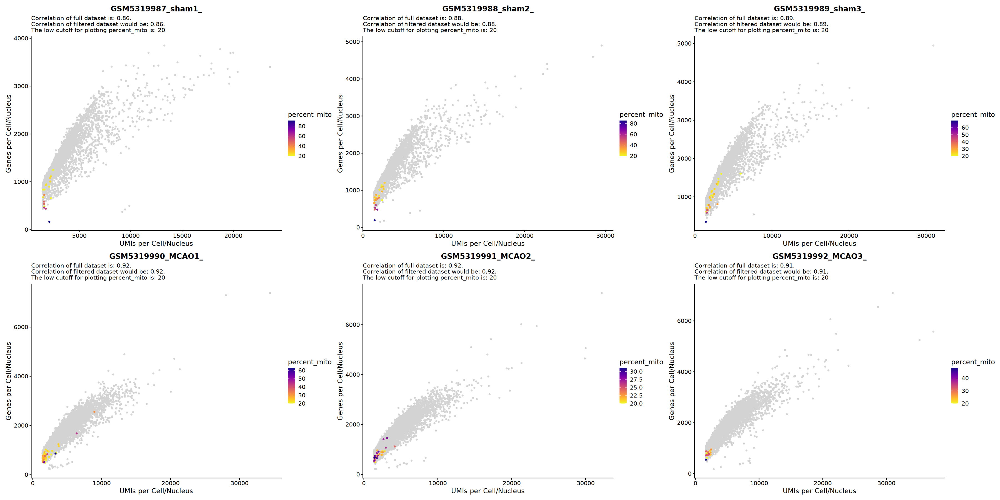

In [237]:
options(repr.plot.width = 30, repr.plot.height = 15)

patchwork::wrap_plots(plot_list, ncol = 3)

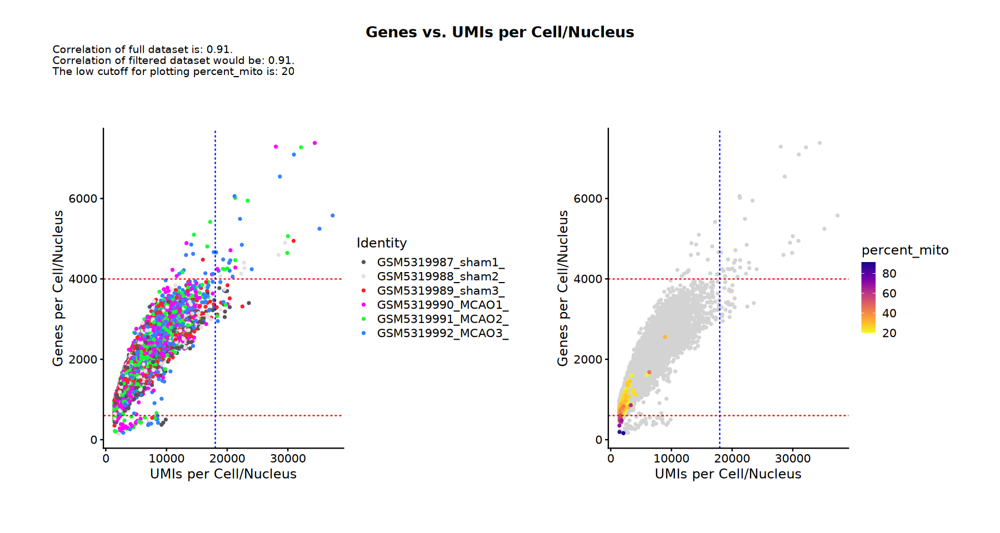

In [242]:
# Combination Plots:
# If you are interested in viewing QC_Plot_UMIvsGene both 
# by discrete grouping variable and by continuous variable 
# without writing function twice you can use combination = TRUE 
# and plot output will contain both plots.

options(repr.plot.width = 15, repr.plot.height = 8)

scCustomize::QC_Plot_UMIvsGene(seurat_object = zheng_et_al_seurat, 
                               group.b = 'sample',
                  meta_gradient_name = "percent_mito", 
                  low_cutoff_gene = 600,
                  high_cutoff_gene = 4000, 
                  high_cutoff_UMI = 18000, 
                  meta_gradient_low_cutoff = 20, 
                  combination = TRUE) & my_margin

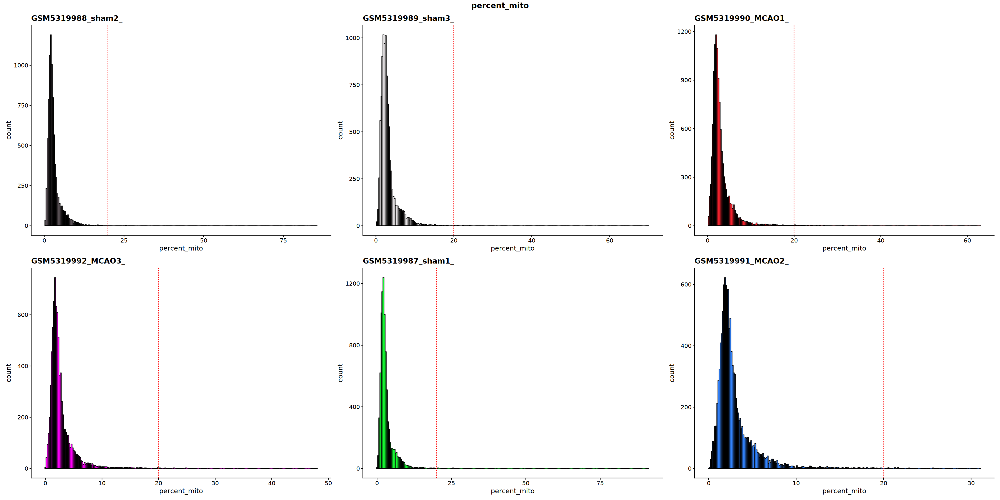

In [248]:
# Histogram-Based QC Plots:
# Finally, scCustomize contains a function to plot QC metrics 
# as histogram instead of violin for visualization of 
# the distribution of feature.

options(repr.plot.width = 30, repr.plot.height = 15)

scCustomize::QC_Histogram(seurat_object = zheng_et_al_seurat,
                          num_columns = 3,
                          split.by = 'sample', 
                          features = "percent_mito", 
                          high_cutoff = 20
)

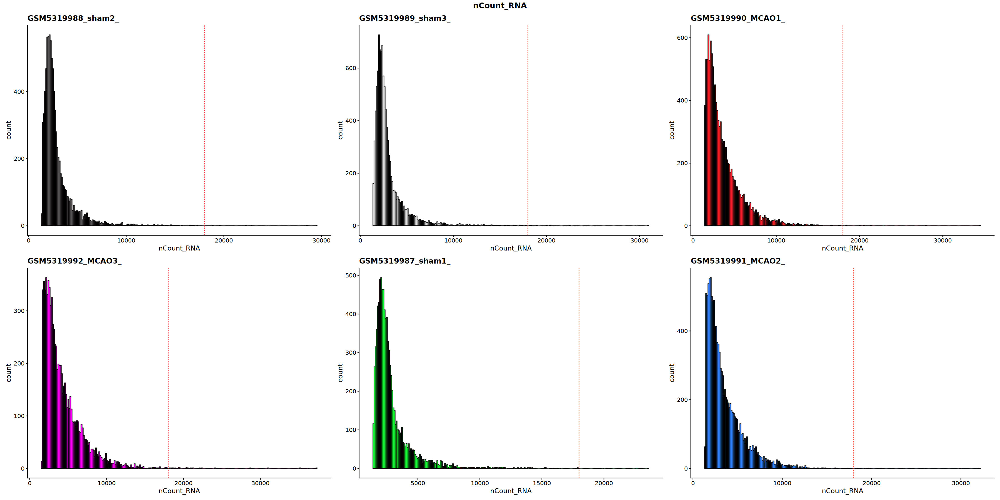

In [249]:
options(repr.plot.width = 30, repr.plot.height = 15)

scCustomize::QC_Histogram(seurat_object = zheng_et_al_seurat,
                          high_cutoff = 18000,
                          num_columns = 3,
                          split.by = 'sample', 
                          features = "nCount_RNA"
                         )

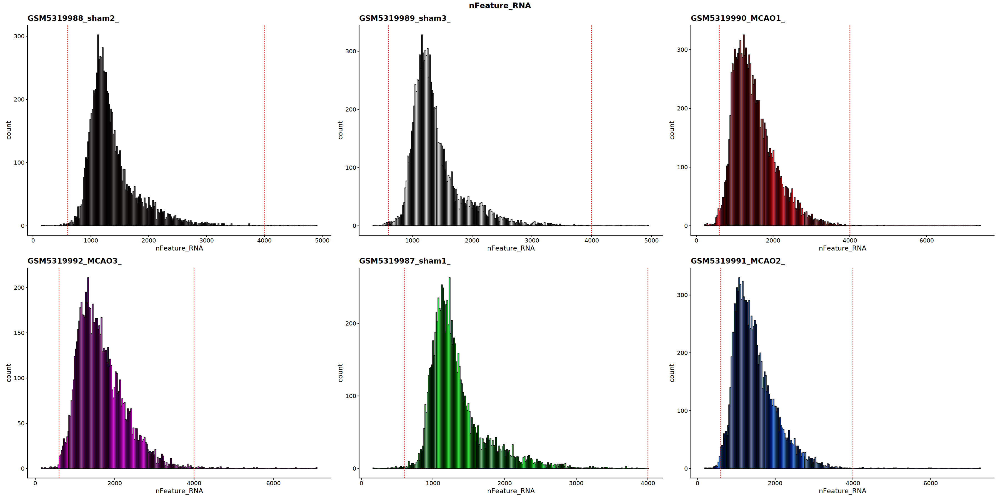

In [250]:
options(repr.plot.width = 30, repr.plot.height = 15)

scCustomize::QC_Histogram(seurat_object = zheng_et_al_seurat,
                          high_cutoff = 4000,
                          low_cutoff = 600,
                          num_columns = 3,
                          split.by = 'sample', 
                          features = "nFeature_RNA", 
                          )

    "Analyze Median QC Values per Sample/Library
    scCustomize also contains a few helpful functions for 
    returning and plotting the median values for these metrics on 
    per sample/library basis.
    
    Calculate Median Values & Return data.frame
    scCustomize contains function Median_Stats to quickly 
    calculate the medians for basic QC stats (Genes/, UMIs/, %Mito/Cell, etc) 
    and return a data.frame."

In [251]:
median_stats <- scCustomize::Median_Stats(seurat_object = zheng_et_al_seurat, 
                                          group_by_var = "sample")

In [252]:
median_stats

sample,Median_nCount_RNA,Median_nFeature_RNA,Median_percent_mito,Median_percent_ribo,Median_percent_mito_ribo,Median_log10GenesPerUMI
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
GSM5319987_sham1_,2391,1231.0,2.366864,9.212849,11.92432,0.9159574
GSM5319988_sham2_,2422,1257.0,2.365457,8.956337,11.66907,0.9167605
GSM5319989_sham3_,2471,1281.0,2.514346,8.612895,11.39538,0.9163217
GSM5319990_MCAO1_,2982,1396.0,2.389622,7.838254,10.81405,0.9043024
GSM5319991_MCAO2_,2883,1365.0,2.300347,8.048666,10.96288,0.9049377
GSM5319992_MCAO3_,3495,1554.5,2.086694,8.396275,11.06532,0.8992593
Totals (All Cells),2677,1324.0,2.343252,8.482147,11.27353,0.9106421


In [253]:
# access slots without quotes:

pull_slot <- function(.data, slot_name) {
  slot(.data, rlang::as_string(rlang::ensym(slot_name)))
}

In [254]:
zheng_et_al_seurat %>% pull_slot(meta.data) %>% names()

[1] "orig.ident"                  "nCount_RNA"                 
 [3] "nFeature_RNA"                "_index"                     
 [5] "sample"                      "n_genes_by_counts"          
 [7] "log1p_n_genes_by_counts"     "total_counts"               
 [9] "log1p_total_counts"          "pct_counts_in_top_50_genes" 
[11] "pct_counts_in_top_100_genes" "pct_counts_in_top_200_genes"
[13] "pct_counts_in_top_500_genes" "n_genes"                    
[15] "doublet_score"               "predicted_doublet"          
[17] "status"                      "_scvi_batch"                
[19] "_scvi_labels"                "percent_mito"               
[21] "percent_ribo"                "percent_mito_ribo"          
[23] "log10GenesPerUMI"            "percent_top50"              
[25] "percent_oxphos"              "percent_apop"               
[27] "percent_dna_repair"          "percent_ieg"                
[29] "percent_hemo"                "S.Score"                    
[31] "G2M.Score"                   "Phase"

    "The Median_Stats function has some column names stored by default 
    but will also calculate medians for additional meta.data columns 
    using the optional median_var parameter."

In [256]:
median_stats <- scCustomize::Median_Stats(seurat_object = zheng_et_al_seurat, 
                                          group_by_var = "sample", 
                                          median_var = "S.Score")

median_stats[, c("sample","Median_S.Score"), drop = FALSE] %>% print()

# A tibble: 7 x 2
  sample             Median_S.Score
  <chr>                       <dbl>
1 GSM5319987_sham1_        -0.0103 
2 GSM5319988_sham2_        -0.0103 
3 GSM5319989_sham3_        -0.0114 
4 GSM5319990_MCAO1_        -0.00224
5 GSM5319991_MCAO2_        -0.00205
6 GSM5319992_MCAO3_        -0.00397
7 Totals (All Cells)       -0.00655


    "Plotting Median Values: 
    scCustomize also contains a few functions to plot some of 
    these median value calculations, which can be used on their 
    own without need to return data.frame first."

    "Used to plot any other numeric variable present in object meta.data slot."

In [257]:
p1 <- scCustomize::Plot_Median_UMIs(seurat_object = zheng_et_al_seurat, 
                              sample_col = 'sample', # default is orig.ident.,
                              group_by = "status")


p2 <- scCustomize::Plot_Median_Genes(seurat_object = zheng_et_al_seurat, 
                              sample_col = 'sample', # default is orig.ident.,
                              group_by = "status")

p3 <- scCustomize::Plot_Median_Mito(seurat_object = zheng_et_al_seurat, 
                              sample_col = 'sample', # default is orig.ident.,
                              group_by = "status")

Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.
Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


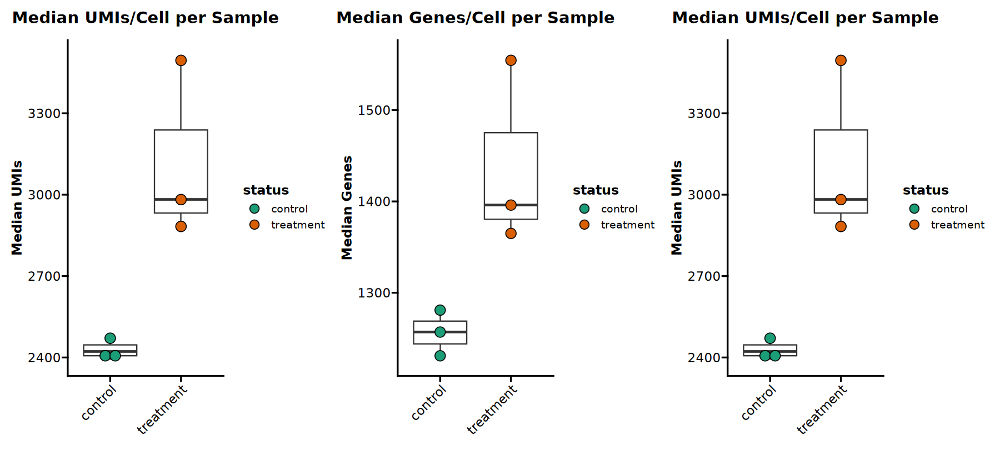

In [258]:
options(repr.plot.width = 15, repr.plot.height = 7)

patchwork::wrap_plots(p1, p2, p1, ncol = 3)

Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


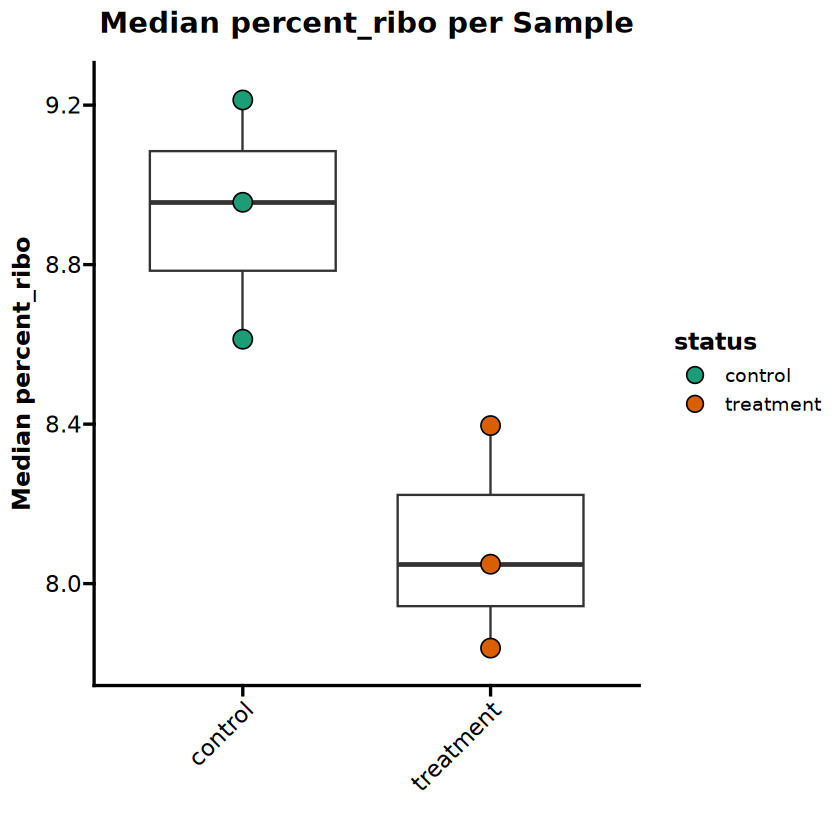

In [259]:
# for other meta.data features:

options(repr.plot.width = 7, repr.plot.height = 7)

scCustomize::Plot_Median_Other(seurat_object = zheng_et_al_seurat, 
                               sample_col = 'sample', # default is orig.ident.
                               median_var = "percent_ribo",
                               group_by = "status")

    "Plot Number of Cells/Nuclei per Sample:
    
    scCustomize also contains plotting function to plot 
    the number of cells or nuclei per sample."

Bin width defaults to 1/30 of the range of the data. Pick better value with
`binwidth`.


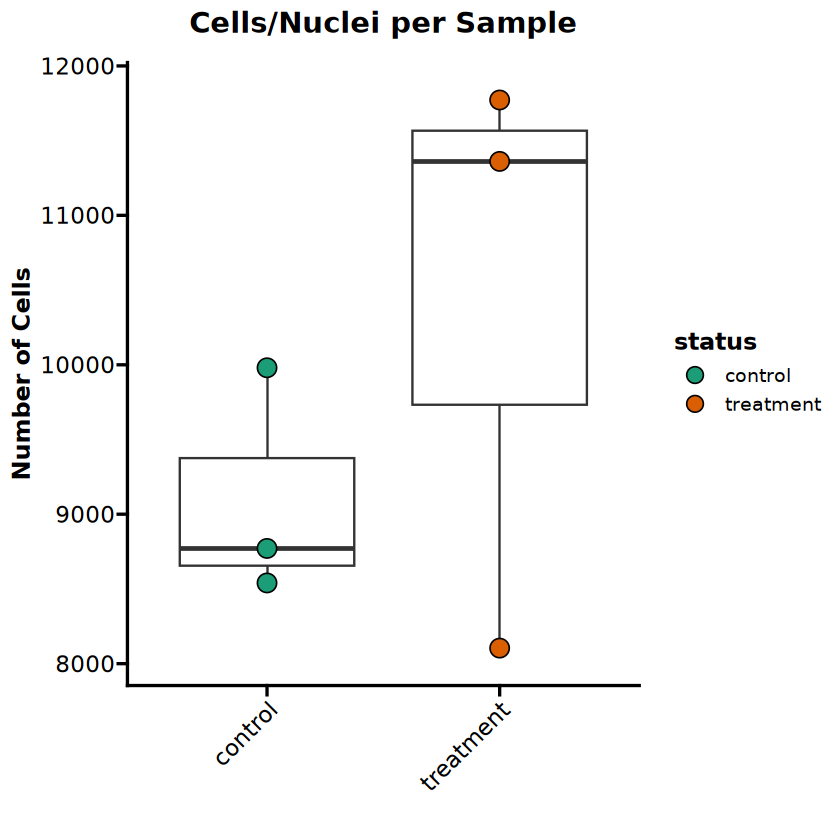

In [260]:
# Total number of cells in each sample:

scCustomize::Plot_Cells_per_Sample(seurat_object = zheng_et_al_seurat, 
                               sample_col = 'sample', # default is orig.ident.
                               group_by = "status")

In [266]:
# Next, check number of cell after filtering:

In [267]:
zheng_et_al_seurat

An object of class Seurat 
19707 features across 58528 samples within 1 assay 
Active assay: RNA (19707 features, 0 variable features)
 1 layer present: counts
 4 dimensional reductions calculated: Xpca_, XscVI_, XscVImde_, Xumap_

In [268]:
zheng_et_al_seurat %>% subset(subset = nFeature_RNA > 600 & nFeature_RNA < 4000 & nCount_RNA < 18000 & percent_mito < 20)

An object of class Seurat 
19707 features across 58051 samples within 1 assay 
Active assay: RNA (19707 features, 0 variable features)
 1 layer present: counts
 4 dimensional reductions calculated: Xpca_, XscVI_, XscVImde_, Xumap_

In [271]:
# Do filtering to remove low quality cells:

zheng_et_al_seurat <- zheng_et_al_seurat %>% subset(subset = nFeature_RNA > 600 & 
                                                    nFeature_RNA < 4000 & 
                                                    nCount_RNA < 18000 &
                                                    percent_mito < 20)

In [272]:
zheng_et_al_seurat

An object of class Seurat 
19707 features across 58051 samples within 1 assay 
Active assay: RNA (19707 features, 0 variable features)
 1 layer present: counts
 4 dimensional reductions calculated: Xpca_, XscVI_, XscVImde_, Xumap_

In [273]:
zheng_et_al_seurat %>% 
    saveRDS(here::here('r_objects', 'zheg_et_al_seurat_filtered.RDS'))

Next, I will continue with clustering and cell type annotation.

In [275]:
sessionInfo()

R version 4.4.2 (2024-10-31)
Platform: x86_64-unknown-linux-gnu
Running under: Red Hat Enterprise Linux 9.4 (Plow)

Matrix products: default
BLAS/LAPACK: /gnu/store/mj1kw87qd3m1q7r4844adkn5hifx8k6a-openblas-0.3.20/lib/libopenblasp-r0.3.20.so;  LAPACK version 3.9.0

locale:
 [1] LC_CTYPE=C          LC_NUMERIC=C        LC_TIME=C          
 [4] LC_COLLATE=C        LC_MONETARY=C       LC_MESSAGES=C.UTF-8
 [7] LC_PAPER=C          LC_NAME=C           LC_ADDRESS=C       
[10] LC_TELEPHONE=C      LC_MEASUREMENT=C    LC_IDENTIFICATION=C

time zone: Europe/Berlin
tzcode source: system (glibc)

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
[1] ggplot2_3.5.1      magrittr_2.0.3     Seurat_5.1.0       SeuratObject_5.0.2
[5] sp_2.1-4          

loaded via a namespace (and not attached):
  [1] RcppAnnoy_0.0.22            splines_4.4.2              
  [3] later_1.3.2                 prismatic_1.1.2            
  [5] pbdZMQ_0